# <span style="color:red">Ricerca Tabelle simili su PubTables-1M </span>

Il dataset **PubTables-1M (Table Structure Recognition Subset)** è una raccolta di quasi un milione di tabelle estratte da articoli scientifici, progettata per supportare attività come il riconoscimento della struttura delle tabelle e l'analisi funzionale. 

##### Struttura cartelle

Prima di eseguire il seguente notebook assicurarsi di avere scaricato il dataset PubTables-1M ed avere la seguente struttura delle cartelle dati:
```none
Find_similar_tables_on_PubTables-1M
├── ...
├── es tabella e XML corrispondente
├── Primi20_PubTables
├── PubTables-1M
│   ├── images
│   │   ├── tablename.jpg
│   │   ├── ...
│   ├── test
│   │   ├── tablename.XML
│   │   ├── ...
│   ├── train
│   │   ├── tablename.XML
│   │   ├── ...
│   ├── val
│   │   ├── tablename.XML
│   │   ├── ...
│   ├── words
│   │   ├── tablename.JSON
│   │   ├── ...
```
Se il dataset PubTables-1M è stato appena scaricato come file .zip, è possibile che la sua struttura contenga delle sottocartelle annidate. Ad esempio, potrebbe essere necessario accedere a una directory interna in più, come /PubTables-1M/images/images invece del previsto /PubTables-1M/images/.

## **<span style="color:purple">Caratteristiche principali del dataset</span>**

Il dataset PubTables-1M è divisio in modo casuale in set di training, validation e test a livello di documento utilizzando una suddivisione 80/10/10. Per TSR (Table Structure Recognition), questo si traduce in 758.849 tabelle per training; 94.959 per validation; e 93.834 per testing. Si noti che queste tabelle occupano ciascuna una sola pagina: le tabelle che occupano più pagine sono considerate al di fuori dell'ambito di questo lavoro.

- ***Origine dei dati:*** le tabelle provengono da articoli scientifici, offrendo una varietà di strutture e formati reali.

- ***Struttura delle Cartelle:*** il dataset contiene 5 cartelle principali:  
    - *images*: immagini in formato JPG  
    - *train*: annotazioni delle bounding box degli oggetti in formato XML 
    - *test*: annotazioni delle bounding box degli oggetti in formato XML   
    - *val*: annotazioni delle bounding box degli oggetti in formato XML 
    - *words*: bounding box delle parole e testo in formato JSON


**Accesso al dataset:**
il dataset è disponibile su Kaggle al seguente link: https://www.kaggle.com/datasets/bsmock/pubtables-1m-structure/data

---

Il dataset è costituito da immagini di tabelle e file XML associati che descrivono la struttura delle tabelle, allora è sicuramente più efficiente e preciso utilizzare i file XML per estrarre le informazioni strutturali delle tabelle, piuttosto che cercare di estrarre queste informazioni direttamente dalle immagini. Inoltre nei file JSON è presente il testo contenuto dalle tabelle.

#### Esempio immagine tabella

Esempio di tabella in formato immagine:
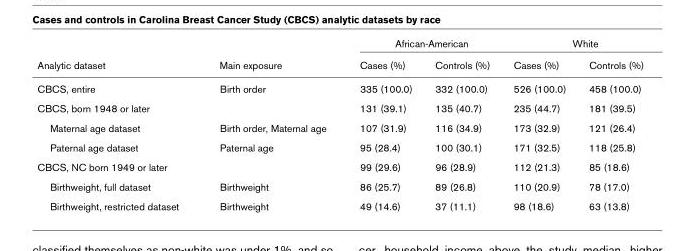

#### Esempio file XML

Un esempio di contenuto all'interno di un file XML corrispondente alla precedente tabella è il seguente:

```XML
<!-- XML della tabella precedente -->
<?xml version="1.0" ?>
<annotation>
   <folder/>
   <filename>PMC1064078_table_0.jpg</filename> // indicato il nome del file
   <path>PMC1064078_table_0.jpg</path> // indica il percorso del file
   <source>
      <database>PubTables1M-Structure</database>
   </source>
   <size> // dimensioni della immagine che contiene la tabella
      <width>682</width>
      <height>251</height>
      <depth>3</depth>
   </size>
   <segmented>0</segmented>
   <object>
      <name>table</name> // informazioni sulla tabella
      <pose>Frontal</pose>
      <truncated>0</truncated>
      <difficult>0</difficult>
      <occluded>0</occluded>
      <bndbox> // boundingbox che ci descrive l'estensione della tabella rispetto all'immagine
         <xmin>36.5556</xmin>
         <ymin>36.6853</ymin>
         <xmax>643.1767</xmax>
         <ymax>211.7458</ymax>
      </bndbox>
   </object>
   <object>
      <name>table spanning cell</name> // cella che si estende su più colonne o righe
      <pose>Frontal</pose>
      <truncated>0</truncated>
      <difficult>0</difficult>
      <occluded>0</occluded>
      <bndbox>
         <xmin>36.5556</xmin>
         <ymin>36.6853</ymin>
         <xmax>198.5530</xmax>
         <ymax>76.3748</ymax>
      </bndbox>
   </object>
   [...]
   <object>
      <name>table column header</name> // testata della colonna della tabella
      <pose>Frontal</pose>
      <truncated>0</truncated>
      <difficult>0</difficult>
      <occluded>0</occluded>
      <bndbox>
         <xmin>36.5556</xmin>
         <ymin>36.6853</ymin>
         <xmax>643.1767</xmax>
         <ymax>76.3748</ymax>
      </bndbox>
   </object>
   <object>
      <name>table row</name> // riga della tabella
      <pose>Frontal</pose>
      <truncated>0</truncated>
      <difficult>0</difficult>
      <occluded>0</occluded>
      <bndbox>
         <xmin>36.5556</xmin>
         <ymin>36.6853</ymin>
         <xmax>643.1767</xmax>
         <ymax>53.5717</ymax>
      </bndbox>
   </object>
   [...]
   <object>
      <name>table column</name> // colonna della tabella
      <pose>Frontal</pose>
      <truncated>0</truncated>
      <difficult>0</difficult>
      <occluded>0</occluded>
      <bndbox>
         <xmin>36.5556</xmin>
         <ymin>36.6853</ymin>
         <xmax>198.5530</xmax>
         <ymax>211.7458</ymax>
      </bndbox>
   </object>
   [...]
</annotation>
```

Come è possibile notare dell'esempio, il **file XML** descrive la struttura della tabella presente nell'immagine associata annotando righe, colonne e celle con le relative informazioni. Esso contiene annotazioni relative agli elementi della tabella, specificando la loro posizione attraverso bounding box.  

#### Struttura e contenuto del file XML
I files XML del dataset seguono questo schema principale:
- **`<annotation>`**: nodo radice che contiene le annotazioni.
- **`<filename>` e `<path>`**: Nome e percorso dell'immagine corrispondente.
- **`<size>`**: Dimensioni dell'immagine (larghezza, altezza, profondità di colore).
- **`<object>`**: Descrive gli elementi della tabella (tabella, colonne, righe, celle, ecc.).

#### Elementi presenti all'interno di  `<object>`
All'interno di `<object>` si trova l'attributo **`<name>...</name>`** che indica il tipo di elemento della tabella che descrive. Il tag può avere le seguenti indicazioni: 
- *`<name>table</name>`*: descrive l'intera tabella.
- *`<name>table column header</name>`*: descrive l'intestazione della colonna.
- *`<name>table projected row header</name>`*: indica un'intestazione di riga proiettata, ovvero una cella che funge da etichetta per una o più righe.
- *`<name>table column</name>`*: descrive una colonna della tabella.
- *`<name>table row</name>`*: descrive una riga della tabella.
- *`<name>table spanning cell</name>`*: descrive una cella che si estende su più colonne.

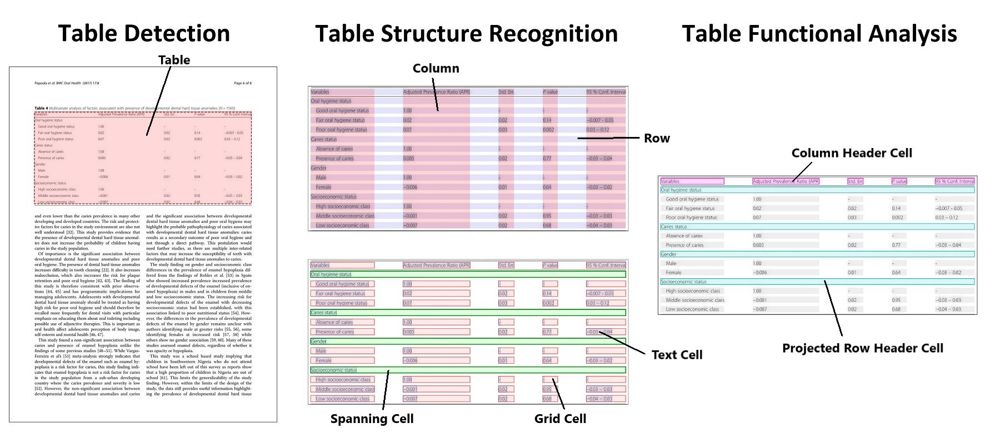

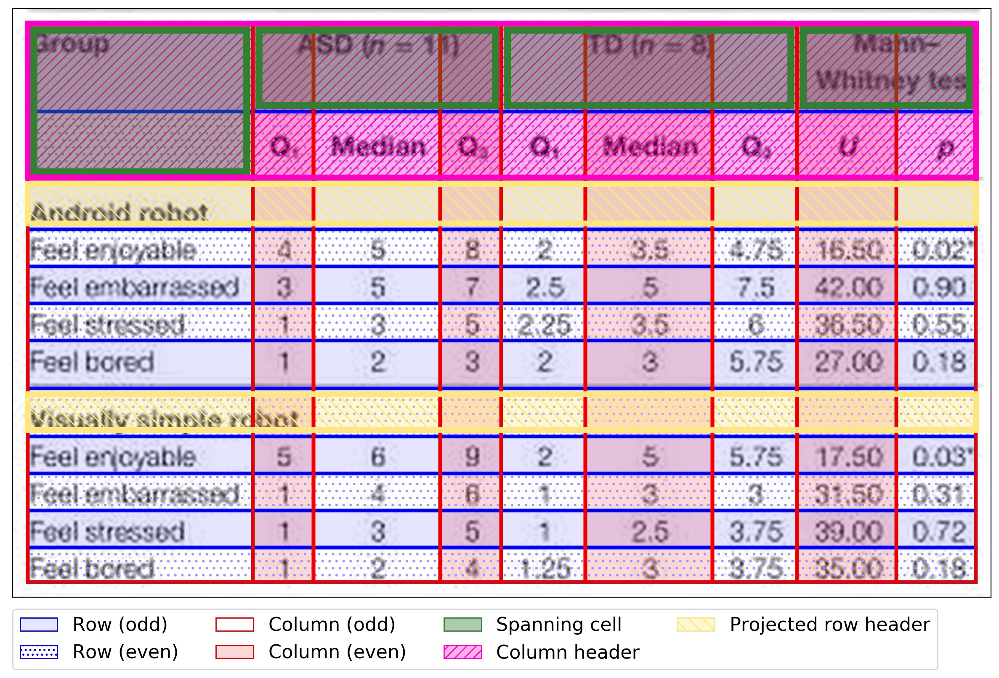

L'annotazione **`<pose>`** indica la posizione della tabella o dei suoi elementi rispetto all'osservatore. Il campo *pose* potrebbe avere altri valori come:
- `"Frontal"`: l'elemento è visto perfettamente di fronte.
- `"Side"`: vista laterale.
- `"Top"`: vista dall'alto.
- `"Oblique"`: vista inclinata.
Nel caso del dataset *PubTables-1M*, sembra che tutte le tabelle siano annotate con "Frontal", perché le immagini sono prese direttamente dai documenti senza inclinazioni.   

Inoltre in `<object>` si ha un bounding box, specificato dall'elemento **`<bndbox>`**, che indica le coordinate in pixel dell'elemento all'interno dell'immagine.

Gli altri attributi presenti all'interno di `<object>` sono i tag **`<truncated>`**, **`<difficult>`** e **`<occluded>`** sono attributi usati per descrivere la qualità della visualizzazione degli oggetti annotati nell'immagine. Questi tag sono spesso utilizzati in dataset di computer vision per indicare se un oggetto è parzialmente visibile o difficile da riconoscere.
- **`<truncated>...</truncated>`**: indica se l'oggetto è tagliato ai bordi dell'immagine. Se 0, l'oggetto è completamente visibile. Se 1, l'oggetto è parzialmente tagliato (es si trova sul bordo dell'immagine).
- **`<difficult>...</difficult>`**: indica se l'oggetto è difficile da riconoscere. Se 0, l'oggetto è chiaramente distinguibile. Se 1, l'oggetto è difficile da riconoscere (es basso contrasto o per sovrapposizioni).  
- **`<occluded>...</occluded>`**: indica se l'oggetto è parzialmente nascosto da altri oggetti. Se 0, l'oggetto è completamente visibile. Se 1, l'oggetto è parzialmente coperto da altri elementi (es una cella della tabella coperta da un'illustrazione o da un altro testo sovrapposto).  

**Riassumendo:**
| **Tag**        | **Descrizione** | **Valori possibili** | **Esempio** |
|---------------|---------------|------------------|------------|
| `<pose>` | Indica la posizione dell'oggetto rispetto all'osservatore. | `Frontal` (vista frontale), `Side` (laterale), `Top` (dall'alto), `Oblique` (inclinata) | `<pose>Frontal</pose>` |
| `<truncated>` | Indica se l'oggetto è tagliato ai bordi dell'immagine. | `0` (completo), `1` (parzialmente tagliato) | `<truncated>0</truncated>` |
| `<difficult>` | Indica se l'oggetto è difficile da riconoscere. | `0` (facile da rilevare), `1` (difficile da rilevare) | `<difficult>0</difficult>` |
| `<occluded>` | Indica se l'oggetto è parzialmente coperto da altri oggetti. | `0` (visibile), `1` (parzialmente nascosto) | `<occluded>0</occluded>` |
| `<bndbox>` | Definisce il rettangolo di delimitazione (bounding box) dell'oggetto nell'immagine. | Contiene `<xmin>`, `<ymin>`, `<xmax>`, `<ymax>` con coordinate in pixel. | ```xml <bndbox><xmin>36.5</xmin><ymin>36.6</ymin><xmax>643.1</xmax><ymax>211.7</ymax></bndbox>``` |

---

**IDEA**: visto che all'interno dei file xml è rappresentata le annotazioni relative alla struttura della tabella come verrebbe vista se fosse una immagine, l'idea è quella di estrarre da questo file xml informazioni utili per trovare la similarità tra tabelle e per farlo si potrebbe calcolare per ogni tabella:
- numero di righe,
- numero di colonne,
- celle che si estendono su più righe o colonne (spanning cells)
- numero di table column header
- numero di table projected row header
- inoltre si potrebbe cercare di capire se il contenuto delle tabelle è numerico (numeri percentuali o singoli), simbolico (es. +, -, V, X) o se testuale, però queste info non sono presenti nell'XML ma nel file JSON.

Se si riuscisse ad estrarre queste informazioni si potrebbero utilizzare per confrontare la struttura delle tabelle e trovare quelle simili (secondo una certa metrica). 
Questo approccio dovrebbe permettere di sfruttare le informazioni strutturali già presenti nei file XML, evitando la complessità di dover estrarre queste informazioni direttamente dalle immagini.

---

Per estrarre queste informazioni, l'idea è di contare il numero di row, column, spanning cell, column header, projected row header all'interno del file XML e utilizzare questo conteggio per creare una features matrix che descrive brevemente la struttura della tabella. Quindi ogni tabella verrà rappresentata come un vettore di features, dove ogni features prende valore pari al numero di elementi del tipo corrispondente.

Notare che row, column e spanning cell sono elementi presenti in tutte le tabelle, mentre column header e projected row header non tutte le tabelle li hanno. Per questo, questi ultimi valori possono essere importanti per distinguere possibili outliers o tabelle.

Per trovare tabelle identiche si potrebbe costruire una matrice delle similarità utilizzando una metrica si similarità coseno o sperimentarne altre. In questo caso ci interessa trovare tabelle identiche strutturalmente. Ma creare una matrice di similarità su tutto il dataset richiede troppa memoria, quindi verrà usata una strategia diversa.

Un esperimento più interessante per trovare tabelle simili è quello di clusterizzare. Quindi l'obbiettivo è di trovare il miglior modo per clusterizzare le tabelle. La scelta ricadrà sull'utilizzo di DBSCAN poichè meno costoso. L'algoritmo di clusterizzazione da utilizzare potrebbe essere da ottimizzare visto che ho tanti dati.
Nel caso della clusterizzazione ci interessa trovare e studiare gli outliers.

Una ulteriore possibile analisi consisterà nel guardare il contenuto delle tabelle e trovare tabelle strutturalmente simili in base al contenuto delle celle (testuale o numeri o segni). Per fare questo si aggiunge altre 3 features alla matrice delle features.

---

## **<span style="color:purple">Analisi struttura delle tabelle presenti nel dataset PubTables-1M</span>**

### <span style="color:blue">Estrazione Features Strutturali </span>

Per estrarre le feature strutturali si deve calcolare `num_rows`, `num_cols`, `num_spanning_cells`, `num_column_headers` e `num_projected_row_headers`. Dato che i file XML non contengono direttamente informazioni come `num_rows` (numero righe) etc, ma rappresentano la struttura della tabella attraverso elementi come `table row` etc, si può estrarre queste informazioni indirettamente analizzando gli elementi presenti nel file XML.

- **Conteggio delle Righe**: si può contare il numero di elementi `<object>` con `<name>table row</name>` per determinare il numero di righe (`num_rows`).

- **Conteggio delle Colonne**: si può contare il numero di elementi `<object>` con `<name>table column</name>` per determinare il numero di colonne (`num_cols`).

- **Conteggio delle celle estese (Spanning Cells)**: si può contare il numero di elementi `<object>` con `<name>table spanning cell</name>` per determinare il numero di celle che si estendono su più righe o colonne.

- **Conteggio delle intestazione delle colonne**: si può contare il numero di elementi `<object>` con `<name>table column header</name>` per determinare il numero di intestazione delle colonne (`num_column_headers`).

- **Conteggio delle intestazioni di riga proiettata**: si può contare il numero di elementi `<object>` con `<name>table projected row header</name>` per determinare il numero di intestazioni di riga proiettata (`num_projected_row_headers`).

#### Codice per estrarre informazioni strutturali dai file XML:

Per contare le righe, le colonne e le celle estese si utilizza `root.findall(".//object[name='table row/column/spanning cell/column header/projected row header']")`.
In seguito, si crea e si salva una matrice `features_matrix` che contiene il numero di ogni elemento strutturale di ogni tabella.

In [1]:
import os
import xml.etree.ElementTree as ET
import numpy as np

# Funzione per estrarre le caratteristiche strutturali da un file XML
def extract_structural_features(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    num_rows = len(root.findall(".//object[name='table row']"))
    num_cols = len(root.findall(".//object[name='table column']"))
    num_spanning_cells = len(root.findall(".//object[name='table spanning cell']"))
    #num_column_headers = len(root.findall(".//object[name='table column header']"))
    num_projected_row_headers = len(root.findall(".//object[name='table projected row header']"))

    return (num_rows, num_cols, num_spanning_cells, num_projected_row_headers) #num_column_headers, num_projected_row_headers)

# Percorso della cartella contenente i file XML
# NB questi percorsi potrebbero essere diversi se si è appena scaricato PubTables 
# (potrebbe essere necessario accedere a una directory annidata in più)
#folder_path = 'Primi20_PubTables/test' # Sfrutta solo 20 tabelle
#folder_path = 'PubTables-1M/test' # In questo modo si usa tutte le tabelle presenti in PubTables-1M in test che sono 93.834
folder_path = 'PubTables-1M/train' # In questo modo si usa tutte le tabelle presenti in PubTables-1M in train che sono 758.849 tabelle

# Ottiene la lista di tutti i file XML nella cartella
xml_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.xml')]
xml_files.sort()  # Assicura ordine coerente

# Estrae le feature e i nomi
features_list = []
filenames = []

for xml_file in xml_files:
    features = extract_structural_features(xml_file)
    features_list.append(features)

    filename = os.path.splitext(os.path.basename(xml_file))[0]  # es: 'PMC123456'
    filenames.append(filename)

# Crea una matrice di caratteristiche per tutte le tabelle
features_matrix = np.array(features_list)

# Salva la matrice delle feature e i nomi file
np.save('features_matrix.npy', features_matrix)
np.save('filenames.npy', np.array(filenames))

Ora ogni riga della `features_matrix` inizialmente nell'analisi era del tipo:

```
[num_rows, num_cols, num_spanning_cells, num_column_headers, num_projected_row_headers]
```

Notare che filenames.npy ci servirà per collegare i risultati di FAISS alle immagini .jpg nella cartella images/, in modo da poter visualizzare i risultati della ricerca di similarità.

**Osservazione**: aggiungendo `column header` e `projected row header`, le features diventano **più discriminative**, soprattutto per identificare **outliers** (tabelle con headers mancanti) e **gruppi strutturalmente coerenti**.

⚠<span style="color:red">**Nota Bene**: Il conteggio della feature *"table column header"* è stato commentato (cioè escluso) dall’analisi in quanto si è osservato successivamente che si tratta di una variabile binaria: una tabella o possiede questa caratteristica oppure no. Questa natura binaria influenzava fortemente il processo di clustering, portando alla formazione di due macro-cluster distinti basati unicamente sulla presenza o assenza della feature.</span>

<span style="color:red">Inoltre, durante la riduzione dimensionale con PCA per la visualizzazione, questa feature risultava troppo dominante rispetto alle altre, condizionando significativamente la distribuzione dei dati e limitando l'efficacia dell'analisi qualitativa.</span>

<span style="color:red">Per questo motivo, al fine di ottenere una rappresentazione più equilibrata e una migliore interpretazione dei cluster all'interno del dataset, si è deciso di rimuoverla. Verrà indicato con **'*'** quando nell'analisi è stato cambiato il numero di features per queste osservazioni.
**Importante**: le prime analisi sono state effettuate includendo questa feature, quindi ne è stata lasciata la traccia in questo notebook perchè comunque possono essere significative.</span>

Quindi in realtà ogni riga della `features_matrix` nell'analisi sarà del tipo:

```
[num_rows, num_cols, num_spanning_cells, num_projected_row_headers]
```

#### Normalizzazione:

Inoltre, è utile **normalizzare** la matrice delle caratteristiche per confrontare tabelle di dimensioni molto diverse. Per fare questo si usa `sklearn.preprocessing.MinMaxScaler`.

Di seguito sono implementati StandardScaler (commentato) e MinMaxScaler.  

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Carica la matrice delle caratteristiche
features_matrix = np.load('features_matrix.npy')

# Inizializza e applica lo StandardScaler
#scaler = StandardScaler()
#features_matrix_scaled = scaler.fit_transform(features_matrix)

# Inizializza e applica il MinMaxScaler
scaler = MinMaxScaler()
features_matrix_scaled = scaler.fit_transform(features_matrix)

# Salva la versione normalizzata
np.save('features_matrix_scaled.npy', features_matrix_scaled)

A questo punto si può usare `features_matrix_scaled` al posto della versione non normalizzata quando vogliamo che le feature siano trattate in base alla loro distribuzione.
Notare che:
- **StandardScaler**, impone media 0, varianza 1.  
- **MinMaxScaler**, comprime tutto tra 0 e 1 (mantiene la forma relativa dei dati).  

Nelle nostre features avremo che il valore del numero di righe e colonne sono molto più grandi rispetto al valore delle altre feature. Quindi si capisce che MinMaxScaler aiuta algoritmi di clustering perché evita che feature con valori più grandi "dominino" sugli altri.
Inoltre è stato scelto di usare MinMaxScaler poichè successivamente sono state introdotte altre 3 features contenenti le informazioni sul contenuto della tabella e rappresentanti le percentuali di testo, numeri e simboli presenti nella tabella. Essendo queste 3 features di contenuto dei valori percentuali, la normalizzazione più corretta da utilizzare in questo caso era MinMax, al fine di riportare tutte le features nell'intervallo [0, 1].

### <span style="color:blue">Ricerca tabelle simili in base alla struttura </span>

#### Calcolo della Similarità

Si utilizza la similarità del coseno per confrontare le tabelle basandosi sulle caratteristiche estratte. Notare che le matrici delle caratteristiche (`features_matrix`) e della similarità (`similarity_matrix`) vengono salvate in file .npy dopo essere state calcolate. Questo permette di riutilizzarle nelle celle successive senza doverle ricalcolare.

In [3]:
from sklearn.metrics.pairwise import cosine_similarity # Similarità coseno controlla l'angolo tra i vettori. Più puntano nella stessa direzione più sono simili
"""
# Carica la matrice delle caratteristiche
#features_matrix = np.load('features_matrix.npy')
features_matrix = np.load('features_matrix_scaled.npy') # Carico la matrice scalata

# Calcolo della similarità (con similarità del coseno)
similarity_matrix = cosine_similarity(features_matrix) # Calcolo della matrice di similarità

# Salva la matrice di similarità per uso successivo
np.save('similarity_matrix.npy', similarity_matrix)
"""

"\n# Carica la matrice delle caratteristiche\n#features_matrix = np.load('features_matrix.npy')\nfeatures_matrix = np.load('features_matrix_scaled.npy') # Carico la matrice scalata\n\n# Calcolo della similarità (con similarità del coseno)\nsimilarity_matrix = cosine_similarity(features_matrix) # Calcolo della matrice di similarità\n\n# Salva la matrice di similarità per uso successivo\nnp.save('similarity_matrix.npy', similarity_matrix)\n"

Il codice precedente restituisce l'errore `MemoryError: Unable to allocate 65.6 GiB for an array with shape (93834, 93834) and data type float64` poichè si lavora con **grandi matrici di similarità**.
Infatti l'errore precedente significa che `cosine_similarity(features_matrix)` sta cercando di creare una **matrice quadrata di dimensione (93.834 x 93.834)**, in cui ogni elemento è un `float64` (cioè 8 byte). Ciò richiede uno spazio in memoria di: 

***93834 * 93834 * 8 bytes ≈ 65.6 GiB***

Per soddisfere questa richiesta serve troppo spazio libero e contiguo, il che è difficile da ottenere anche su macchine potenti.
Per superare la precedente problematica sono state analizzate due soluzioni possibili:
- Calcolo **a blocchi**: si può calcolare la similarità **a blocchi**, ed eventualmente salvarli parzialmente.
- **FAISS**: visto che interessa solo trovare **le tabelle più simili per ognuna**, si può evitare di calcolare **tutta** la matrice di similarità e usare [`FAISS`](https://github.com/facebookresearch/faiss).

Per efficacia ed efficienza, ma soprattuto per curiosità, la scelta è ricaduta su FAISS.

#### FAISS per la ricerca di tabelle simili
FAISS (Facebook AI Similarity Search) è una libreria open-source sviluppata da Facebook AI Research che permette di cercare in maniera efficiente e veloce all’interno di grandi raccolte di vettori. Questi vettori rappresentano dati come parole, frasi, immagini o altri tipi di informazioni, che sono stati trasformati in rappresentazioni numeriche tramite tecniche di machine learning, come gli embeddings. L’obiettivo principale di FAISS è facilitare la ricerca di vettori simili (fonte https://www.domsoria.com/2024/10/cosa-e-lindice-faiss-e-come-si-usa-tecniche-rag/).
Questa supporta **approximate cosine similarity** ed evita di costruire la matrice gigante che genera l'errore sulla memoria.

Supponiamo che servano **solo le 5 tabelle più simili** per ciascuna, **FAISS** è la scelta ideale: è veloce, scalabile e evita di occupare troppa RAM.
Assumendo che `features_matrix_scaled.npy` contenga una matrice normalizzata, si può usare:

In [4]:
import numpy as np
import faiss
from faiss import swigfaiss

# Carica e converti in float32
features_matrix = np.load('features_matrix_scaled.npy').astype('float32') # FAISS richiede float32 quindi si converte in questo formato

# Normalizza i vettori riga per cosine similarity (manuale) -> questa normalizzazione prepara alla cosine similarity
norms = np.linalg.norm(features_matrix, axis=1, keepdims=True)
features_matrix = features_matrix / norms

# Crea l'indice per cosine similarity (che in FAISS è Inner Product su vettori normalizzati)
index = faiss.IndexFlatIP(features_matrix.shape[1]) # Cosine similarity con vettori normalizzati
index.add(features_matrix) # Carichi tutti i tuoi vettori nell’indice.

# Trova i top 5 più simili per ogni tabella (escludendo se stessa poi)
top_k = 6 # per avere 5 risultati escludendo se stessi
# D = distanza (similarità), I = indici
D, I = index.search(features_matrix, top_k)

# Escludi l'autosimilarità --> (non funziona per questo commentato)
#D = D[:, 1:]  # Rimuove la colonna della similarità per la stessa tabella
#I = I[:, 1:]  # Rimuove l'indice della stessa tabella

# Salva i risultati
np.save('top5_similarities.npy', D)
np.save('top5_indices.npy', I)

C:\Users\giost\AppData\Local\Temp\ipykernel_15308\2294579945.py:10: RuntimeWarning: invalid value encountered in divide
  features_matrix = features_matrix / norms


Notare che:
- `I[i]` contiene gli indici delle **5 tabelle più simili alla tabella `i`**
- `D[i]` contiene le **similarità corrispondenti** (valori tra 0 e 1)

Inoltre il comando `index = faiss.IndexFlatIP(features_matrix.shape[1])` crea un indice esatto basato su Inner Product (IP), che, grazie alla normalizzazione, equivale a cosine similarity. "features_matrix.shape[1]" restituisce la dimensione dei vettori (numero di feature per tabella).

Esempio per tabella 14:

In [5]:
filenames = np.load('filenames.npy')

table_id = 14
# Nome della tabella corrispondente
table_name = filenames[table_id]
print(f"Il nome della tabella con indice {table_id} è: {table_name}")
print("Tabella:", table_id)
print("Simili:", I[table_id])
print("Similarità:", D[table_id])

Il nome della tabella con indice 14 è: PMC1064097_table_1
Tabella: 14
Simili: [    14 245009 209834 207794 164458 143397]
Similarità: [1.0000001  0.99995005 0.99995005 0.99995005 0.99993056 0.99993056]


Possiamo anche visualizzare le tabelle simili strutturalmente a una determinata tabella conoscendo il nome della tabella, eseguendo il seguente codice (notare che in questo caso si sfrutta filenames.npy che abbiamo salvato durante l'estrazione delle features). Il seguente codice restituirà le immagini della tabella query e di quelle che FAISS ha indicato come le topk più simili, inoltre vengono riportare le features di queste tabelle per visualizzarne l'efficacia della ricerca di similitudine.

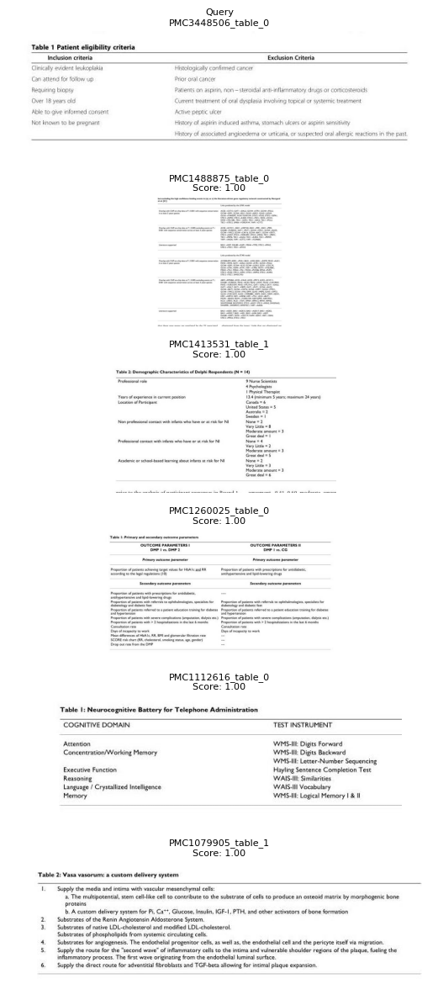

Features della query:
[8 2 1 0]

Features delle top 5 simili:
1) PMC1488875_table_0 - Score: 1.00
[8 2 1 0]
2) PMC1413531_table_1 - Score: 1.00
[8 2 1 0]
3) PMC1260025_table_0 - Score: 1.00
[15  2  2  0]
4) PMC1112616_table_0 - Score: 1.00
[8 2 1 0]
5) PMC1079905_table_1 - Score: 1.00
[8 2 1 0]
6) PMC1064097_table_0 - Score: 1.00
[8 2 1 0]


In [6]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Percorso immagini
image_dir = 'PubTables-1M/images/'

# Carica dati FAISS
I = np.load('top5_indices.npy')       # shape: (n_tabelle, 5)
D = np.load('top5_similarities.npy')  # shape: (n_tabelle, 5)
filenames = np.load('filenames.npy')  # shape: (n_tabelle,)
features_matrix = np.load('features_matrix.npy')  # shape: (n_tabelle, n_features)

# Tabella query (per nome, es. "PMC3448506_table_0")
query_name = 'PMC3448506_table_0'

# Trova l'indice della query nella lista dei file
try:
    query_idx = np.where(filenames == query_name)[0][0]
except IndexError:
    print(f"Tabella {query_name} non trovata!")
    exit()

# Recupera gli indici e punteggi delle 5 più simili
similar_indices = I[query_idx]
similar_scores = D[query_idx]

# Mostra query + 5 simili
fig, axes = plt.subplots(6, 1, figsize=(6, 12))

# Visualizza la query
query_img_path = os.path.join(image_dir, f'{query_name}.jpg')
query_img = Image.open(query_img_path)
axes[0].imshow(query_img, cmap='gray')
axes[0].set_title("Query\n" + query_name, fontsize=8)
axes[0].axis('off')

# Visualizza le top 5 simili
for i in range(5):
    idx = similar_indices[i]
    sim_name = filenames[idx]
    sim_score = similar_scores[i]
    sim_img_path = os.path.join(image_dir, f'{sim_name}.jpg')
    
    try:
        sim_img = Image.open(sim_img_path)
        axes[i+1].imshow(sim_img, cmap='gray')
        axes[i+1].set_title(f"{sim_name}\nScore: {sim_score:.2f}", fontsize=8)
    except FileNotFoundError:
        axes[i+1].text(0.5, 0.5, "Img not found", ha='center', va='center')
    
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()

print("Features della query:")
print(features_matrix[query_idx])

print("\nFeatures delle top 5 simili:")
for i, idx in enumerate(similar_indices):
    print(f"{i+1}) {filenames[idx]} - Score: {similar_scores[i]:.2f}")
    print(features_matrix[idx])

Visualizzando le immagini jpg delle top-k tabelle più simili rispetto alla tabella di esempio ottenute dal calcolo dell'inidce FAISS, possiamo notare che tutte hanno numero righe = 8, numero colonne = 2, numero spanning cells = 1, *{num column headers = 1,} numero projected row headers = 0.

**NB**: notare che i valori delle features risultano essere normalizzati con MinMax scaler, quindi i valori che otterremo in output dalle features potrebbero non essere interi.

Se invece visualizziamo il contenuto possiamo notare come queste tablle in realtà siano molto variegate tra loro.

---

### <span style="color:blue">Clustering in base alla struttura</span>

Per identificare gli utliers all'interno del nostro dataset di tabelle viene utilizzato il clustering. Il clustering viene applicato alla 'features_matrix_scaled' (ovvero la matrice delle features normalizzata). 
Per scegliere il tipo di clustering da utilizzare è stato considerato che **KMeans** è semplice da usare ma può diventare **lento e poco scalabile** su dataset molto grandi come PubTables-1M (quasi un milione di tabelle). Inoltre, non è ottimo per scoprire outlier o strutture non sferiche nei dati. In più per usare KMeans dovremmo conoscere a priori quello che è il numero di cluster. Per questo motivo come algoritmo di clustering è stato deciso di utilizzare **DBSCAN** (Density-Based).

#### **DBSCAN** (Density-Based)
Scelto di usare DBSCAN poichè:
- Non richiede di specificare il numero di cluster.
- Identifica outlier naturalmente.

Se DBSCAN è lento nella sua esecuzione il motivo principali del rallentamento è dovuto al numero molto grande di punti (n) in quanto DBSCAN ha complessità O(n²) nel caso peggiore, perché per ogni punto deve confrontarsi con tutti gli altri per calcolare le distanze. Se features_matrix_scaled ha decine o centinaia di mila righe (ovvero di punti, cioè di tabelle), il calcolo diventa pesante.
Il numero di feature (dimensione) nel caso fosse elevato rappresenterebbe un problema ma nel nostro caso abbiamo solo 5* (4 in realtà) o 8* (7 in realtà) features, quindi DBSCAN rimane una buona scelta. 

Per atturare il clustering con DBSCAN è stato utilizzato quello forntito dalla classe `DBSCAN` di **scikit-learn**, la quale accetta diversi parametri, ma quelli **più importanti** per la qualità del clustering sono principalmente due:
- `eps`: distanza massima tra due punti perché siano considerati vicini (epsilon-neighborhood). **Fondamentale per il risultato finale**. 
- `min_samples`: numero minimo di punti richiesti per formare un "core point". Scelto a seconda della densità del dataset.

Altro parametro aggiuntivo interessante da usare è `metric`, che permette di specificare la metrica/distanza da usare. Di default impostata come`"euclidean"`. Può essere anche `"cosine"`, ecc. Nel caso in esame la metrica euclidea è la migliore da usare.

#### 1. Caricamento della feature matrix scalata

Gli import che ci saranno utili per eseguire l'analisi sono i seguenti:

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

# ======== 1. Caricamento della feature matrix normalizzata ========
features_matrix_scaled = np.load('features_matrix_scaled.npy') # Carico la matrice scalata

Notare che si carica la matrice delle fetures normalizzata. 

#### 2. Scelta dei parametri MinPts e eps di DBSCAN

##### Scelta del parametro MinPts di DBSCAN

Come detto precedentemente, la ***scelta del parametro `min_samples`*** in DBSCAN è fondamentale per determinare la sensibilità del clustering. 
Per scegliere min_samples si usa una formula che varia in base alla dimensionalità delle features (https://www.sefidian.com/2022/12/18/how-to-determine-epsilon-and-minpts-parameters-of-dbscan-clustering/). Regola pratica: **`min_samples = 2 * dim`**

Nel caso iniziale dell'analisi si ha 5* (in realtà 4) feature strutturali ⇒ `min_samples = 10`* (in realtà 8).

##### Stimare il parametro eps di DBSCAN

Il parametro `eps` è sensibile alla scala, per questo prima si usa la normalizzazione sulla la features matrix. Per scegliere il valore corretto di eps, l'idea è di usare il **k-distanze plot** per stimare `eps` in DBSCAN.
Il k-distance plot aiuta a trovare un buon valore per `eps`, osservando la distanza dal *k-esimo vicino più vicino* per ogni punto. In pratica:
1. **`k = min_samples - 1`**, dove `min_samples` è il parametro che si usa in DBSCAN.
2. Si ordina la distanza dal k-esimo vicino per tutti i punti.
3. Si cerca nel grafico un punto in cui la curva mostra una **crescita improvvisa** ("gomito"), allora quello è un buon valore per `eps`.

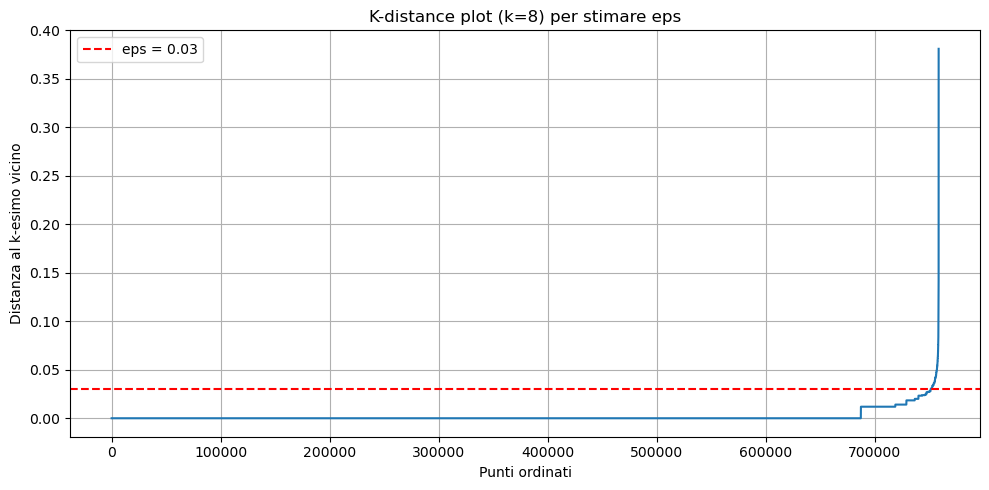

In [8]:
# ======== 2. Stima eps con K-distance plot (facoltativo) ========
#min_samples = 10 # Se 5 features
min_samples = 8 # Se 4 features
k = min_samples - 1

neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors_fit = neighbors.fit(features_matrix_scaled)
distances, indices = neighbors_fit.kneighbors(features_matrix_scaled)
k_distances = np.sort(distances[:, k])

plt.figure(figsize=(10, 5))
plt.plot(k_distances)
plt.title(f"K-distance plot (k={k+1}) per stimare eps")
plt.xlabel("Punti ordinati")
plt.ylabel("Distanza al k-esimo vicino")
plt.grid(True)
# Aggiunge la linea rossa orizzontale per eps scelto
#eps_scelto = 0.06  # <-- qui il valore di eps scelto valido per test set # Se 5 features
#eps_scelto = 0.035 # valore eps per train set # Se 5 features
eps_scelto = 0.030 # valore eps per train set # Se 4 features
plt.axhline(y=eps_scelto, color='red', linestyle='--', label=f'eps = {eps_scelto}')
plt.legend() # Aggiunge legenda
plt.tight_layout()
plt.show()

Riferiti al caso con 5 features:
- Possiamo notare che il gomito della curva è presente ad un ***eps di circa = 0.06 per il test set*** se usiamo MinMaxScaler, se invece usiamo StandardScaler eps è di circa 0.6. Per questo motivo sceglieremo l'eps corretto per applicare DBSCAN. Se cambiamo dataset otteniamo che ***eps di circa = 0.035 per il train set***.

Riferiti al caso con 4 features:
- In questo caso il gomito della curva è presente ad un ***eps di circa = 0.03 per il train set***

---

#### 3. Applicazione DBSCAN

Una volta stimato il valore eps e scelto min_samples, si va ad eseguire il clustering delle tabelle.

In [9]:
# ======== 3. Clustering con DBSCAN ========
"""
features_matrix_scaled = np.load('features_matrix_scaled.npy') # Carica la matrice scalata

# Imposta eps secondo il gomito nel grafico precedente (modifica qui sotto!)
# eps = 0.8 se si usa standardscaler, eps = 0.08 se si usa minmaxscaler
dbscan = DBSCAN(eps=0.06, min_samples=min_samples, metric='euclidean')  # Scegliere `eps` in base al plot, metrica provata a cambiare con cosine al posto di euclidean di default
clusters = dbscan.fit_predict(features_matrix_scaled)
np.save('dbscan_clusters_strutturale_5f.npy', clusters) # Salvo solo le etichette
"""

"\nfeatures_matrix_scaled = np.load('features_matrix_scaled.npy') # Carica la matrice scalata\n\n# Imposta eps secondo il gomito nel grafico precedente (modifica qui sotto!)\n# eps = 0.8 se si usa standardscaler, eps = 0.08 se si usa minmaxscaler\ndbscan = DBSCAN(eps=0.06, min_samples=min_samples, metric='euclidean')  # Scegliere `eps` in base al plot, metrica provata a cambiare con cosine al posto di euclidean di default\nclusters = dbscan.fit_predict(features_matrix_scaled)\nnp.save('dbscan_clusters_strutturale_5f.npy', clusters) # Salvo solo le etichette\n"

Il precedente codice realizza il clustering usando DBSCAN e lo salva in un file .npy che verrà successivamente usato nella nostra analisi.
**Osservazione**: se si usa la metrica 'Coseno' come metrica per il calcolo delle distanze all'interno di DBSCAN si ottiene che tutte le tabelle stanno all'interno dello stesso cluster e che non ci sono outliers. Quindi la metrica giusta da utilizzare è quella 'Euclidea'. 

Notare che si può usare DBSCAN se si usa il test set perchè se si usa il train set allora si riscontra un errore di memoria (MemoryError). Per questo una alternativa è implementata di seguito.

---

#### 3b. Applicazione HDBSCAN

Se si usa DBSCAN su il train set allora si riscontra un errore di memoria (MemoryError) durante l'esecuzione di DBSCAN sulla matrice features_matrix_scaled che contiene ~750.000 tabelle.  Questo è prevedibile: l’algoritmo DBSCAN standard in scikit-learn ha complessità quadratica in memoria e tempo in quanto costruisce esplicitamente una struttura dei vicini entro un certo raggio per ogni punto. 
Per superare questi problemi è stato utilizzato **HDBSCAN** che risulta essere un DBSCAN approssimato. Il pacchetto hdbscan (un’estensione di DBSCAN più efficiente e scalabile) permette clustering su grandi dataset, sfruttando strutture dati ottimizzate.
Vantaggi:
- Funziona su grandi dataset (anche >1 milione di punti).
- Più veloce e usa meno memoria.
 
L'HDBSCAN utilizzato è documentato al seguente link: https://hdbscan.readthedocs.io/en/latest/api.html .
I parametri di **HDBSCAN** che vengono utilizzati sono i seguenti:
- `min_cluster_size`: indica quante istanze al minimo si vuole in un cluster, e dipende dalla granularità che si cerca. In questo caso non vorrei avere cluster troppo piccoli ed avendo tanti dati suppongo che un range da 10 a 100 come dimensione minima per i cluster possa essere un buon compromesso.
- `min_samples`: controlla la robustezza, spesso si imposta = min_cluster_size, oppure = dimensione_feature * 2. In questo caso si utilizza **dimensione_feature * 2** poichè scelto come notazione anche per DBSCAN.
- `cluster_selection_epsilon`: aiuta a separare cluster vicini. Piccoli valori danno cluster più netti. In questo specifico caso si potrebbe scegliere guardando la k-distanze plot in modo simile a come abbiamo scelto eps. Notare che cluster_selection_epsilon è una soglia di distanza. I clusters sotto questo valore saranno uniti. Questo rappresenta il minimo epsilon permesso.

**Riferiti al caso con 5 features:**
Preso min_samples = dim*2 per le cosiderazioni precedenti, per trovare i valori ottimali di `min_cluster_size`, `min_samples` e `cluster_selection_epsilon` in **HDBSCAN** sono stati fatti diversi esperimenti provando a variare i parametri, ottenendo i seguenti risultati (messi in tabella):

| **min\_cluster\_size** | **cluster\_selection\_epsilon** | **Cluster trovati** | **Outliers** | **Note**                                        |
| ---------------------- | ------------------------------- | ------------------- | ------------ | ----------------------------------------------- |
| 10                     | 0.030                           | Tanti               | Sì           | Molti cluster e molti outlier                   |
| 10                     | 0.049                           | 2                   | -            | Divisione esatta in 2 cluster                   |
| 15                     | 0.045                           | 3                   | Sì           | Tutto a sinistra, cluster minimi da 17 elementi |
| 15                     | 0.040                           | 5                   | Sì           | Sinistra e destra, cluster minimi da 17/24 el   |
| 20                     | 0.039                           | 4                   | -            | Tutto a destra, cluster minimi da 24 el         |
| 25                     | 0.040                           | 2                   | -            | Divisione perfetta in 2 cluster                 |
| 25                     | 0.037                           | 4                   | -            | Cluster minimi da 37 el                         |
| 25                     | 0.0385                          | 4                   | Sì           | Outlier spostati a destra                       |
| 25                     | 0.036                           | 4                   | Sì           | Outlier spostati a destra                       |
| 30                     | 0.035                           | 5                   | -            | Cluster minimi da 40 el                         |
| 30                     | 0.037                           | 4                   | Sì           | Cluster minimo da 37 el                         |
| 30                     | 0.040                           | 2                   | No           | Divisione netta in 2 cluster                    |
| 38                     | 0.035                           | 3                   | Sì           | Outlier spostati a destra                       |
| 40                     | 0.037                           | 3                   | Sì           | -                                               |
| 50                     | 0.040                           | 2                   | No           | Divisione netta in 2 cluster                    |

Si nota che al diminuire di min_cluster_size (circa 10) e all'aumtentare di epsilon (circa 0.045) gli outliers sono tutti vicino al cluster di sinistra nell'immagine della PCA. Se invece aumentiamo il min_cluster_size (circa 40) e abbiamo un epsilon leggeremente più basso (circa 0.037) gli outliers sono tutti vicini al cluster di destra nell'immagine della PCA. Questo mostra che valori troppo bassi di min_cluster_size frammentano troppo il dataset e generano falsi positivi tra gli outliers. Inoltre conferma che epsilon agisce come un "collante" tra i punti di confine: un valore troppo alto maschera gli outliers. 
Si capisce quindi che la zona migliore per studiare gli outliers è quella con: min_cluster_size tra 25 e 38, cluster_selection_epsilon tra 0.035 e 0.0385.
Alla fine è stato scelto di utilizzare **cluster_selection_epsilon = eps (0.035)** indicata dal k-distance plot. Il **min_cluster_size** di conseguenza è stato preso il più piccolo che escludesse i cluster di piccola dimensione (**38**). Queste scelte sono state fatte in modo da avere pochi cluster grossi e comunque poter analizzare gli outliers.

**Riferiti al caso con 4 features:**
Avendo già fatto esperimenti con 5 features in questo caso è stato più semplice trovare i valori ottimali, per questo di seguito si riporta i risultati dei pochi esperimenti fatti:
| **min\_cluster\_size** | **cluster\_selection\_epsilon** | **Cluster trovati** | **Outliers** | **Note**                                        |
| ---------------------- | ------------------------------- | ------------------- | ------------ | ----------------------------------------------- |
|
| 38                     | 0.035                           | 7                   | si           | min dim cluster 39 e 54
| 55                     | 0.030                           | 6                   | si           | cluster vicini tra loro in PCA

Scelto di utilizzare **cluster_selection_epsilon = eps (0.03)** indicata dal k-distance plot. Il **min_cluster_size** di conseguenza è stato preso il più piccolo che escludesse i cluster di piccola dimensione (**55**). Queste scelte sono state fatte in modo da avere pochi cluster grossi e comunque poter analizzare gli outliers.

In [10]:
# ======== 3b. Clustering con HDBSCAN ========
import hdbscan

# min_samples = 10 # dim*2 => 5*2 = 10 # Se 5 features
min_samples = 8 # dim*2 => 4*2 = 8 # Se 4 features

hdbscan = hdbscan.HDBSCAN(min_cluster_size=55, min_samples=min_samples, cluster_selection_epsilon=0.030, metric='euclidean')
clusters = hdbscan.fit_predict(features_matrix_scaled)
np.save('hdbscan_clusters_strutturale_5f.npy', clusters)

C:\Users\giost\anaconda3\envs\DM\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\giost\anaconda3\envs\DM\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


---

#### 4. Visualizzazione grafico a barre per mostrare il numero di tabelle in ciascun cluster

Eseguito DBSCAN si va a visualizza i risultati in un grafico a barre per mostrare il numero di tabelle in ciascun cluster. 
Per contare le tabelle per cluster si utilizza numpy. Per creare il grafico a barre si utilizza matplotlib e seaborn.

Numero di tabelle per cluster:
Cluster -1: 7045 tabelle
Cluster 0: 106577 tabelle
Cluster 1: 14130 tabelle
Cluster 2: 67901 tabelle
Cluster 3: 20830 tabelle
Cluster 4: 65249 tabelle
Cluster 5: 57617 tabelle
Cluster 6: 419500 tabelle


C:\Users\giost\AppData\Local\Temp\ipykernel_15308\3712202980.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=unique_clusters, y=counts, palette="viridis")


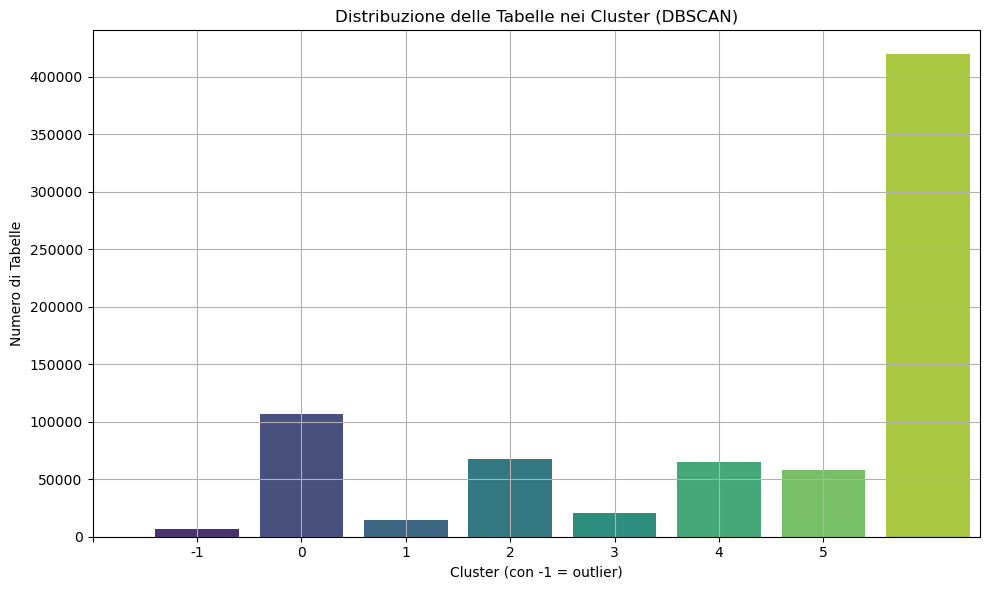

In [11]:
# ======== 4. Istogramma: numero di tabelle per cluster ========
#clusters = np.load('dbscan_clusters_strutturale_5f.npy') # Ricarico le etichette DBSCAN in modo da poterle usare
clusters = np.load('hdbscan_clusters_strutturale_5f.npy') # Ricarico le etichette HDBSCAN in modo da poterle usare

unique_clusters, counts = np.unique(clusters, return_counts=True)

# Stampa il numero di elementi per ogni cluster
print("Numero di tabelle per cluster:")
for cluster, count in zip(unique_clusters, counts):
    print(f"Cluster {cluster}: {count} tabelle")

plt.figure(figsize=(10, 6))
sns.barplot(x=unique_clusters, y=counts, palette="viridis")
plt.title("Distribuzione delle Tabelle nei Cluster (DBSCAN)")
plt.xlabel("Cluster (con -1 = outlier)")
plt.ylabel("Numero di Tabelle")
plt.xticks(unique_clusters)
plt.grid(True)
plt.tight_layout()
plt.show()

Guardando il grafico che si ottiene con l'uso di 4 features e con l'applicazione di HDBSCAN (cluster_selection_epsilon = 0.03 e min_cluster_size = 55), si può notare come le tabelle si distribuiscano nei vari cluster, ma soprattuto notiamo che abbiamo un cluster con un numero di tabelle molto maggiore rispetto agli altri.

---

#### 5. Visualizzare i cluster su 2D con PCA

Per ottenere una ulteriore visualizzazione interessante dei cluster si va ad utilizzare la PCA. PCA è utile se vogliamo una trasformazione semplice e veloce per clustering o preprocessing, in modo da poter rappresentare in 2D il clustering ottenuto. Quindi scelto PCA poichè il dataset è composto da 1 milione di elementi e se si fosse scleto t-SNE avrei avuto una visualizzazione 2D migliore ma lenta nell'esecuzione.
In questo caso si applica sulla matrice `features_matrix_scaled`.

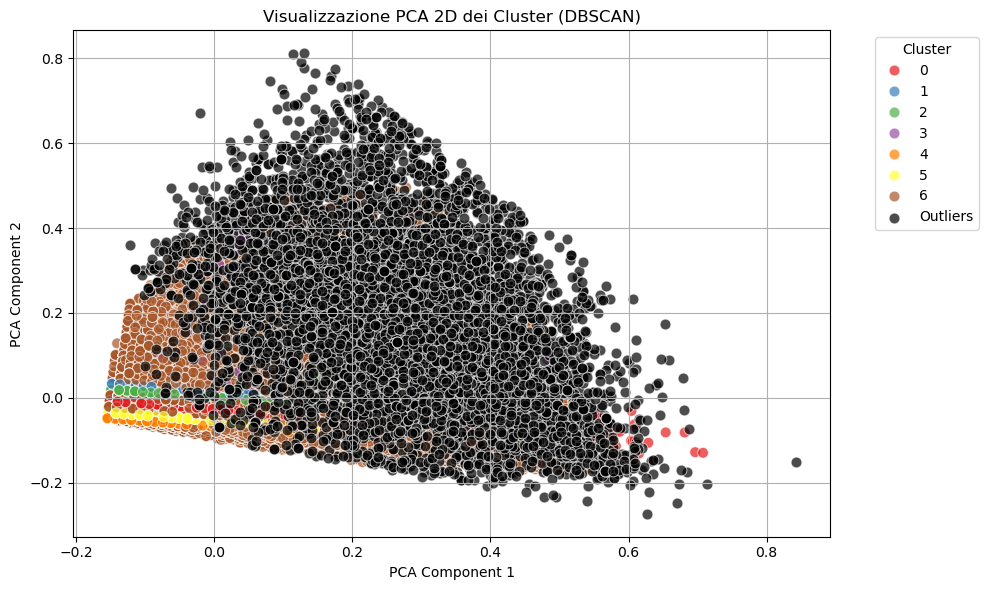

In [12]:
# ======== 5. Visualizzazione 2D con PCA ========
# Carica i dati
#clusters = np.load('dbscan_clusters_strutturale_5f.npy')
clusters = np.load('hdbscan_clusters_strutturale_5f.npy') # Ricarico le etichette HDBSCAN in modo da poterle usare

# PCA
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_matrix_scaled)

# Crea una figura
plt.figure(figsize=(10, 6))

# Maschere per outlier e cluster veri
outlier_mask = clusters == -1
cluster_mask = clusters != -1

# Plot dei cluster normali (cerchi colorati)
sns.scatterplot(
    x=features_pca[cluster_mask, 0],
    y=features_pca[cluster_mask, 1],
    hue=clusters[cluster_mask],
    palette="Set1",
    s=60,
    alpha=0.7,
    legend='full',
)

# Plot degli outlier (cerchi neri)
sns.scatterplot(
    x=features_pca[outlier_mask, 0],
    y=features_pca[outlier_mask, 1],
    color='black',
    s=60,
    alpha=0.7,
    label='Outliers'
)


plt.title("Visualizzazione PCA 2D dei Cluster (DBSCAN)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

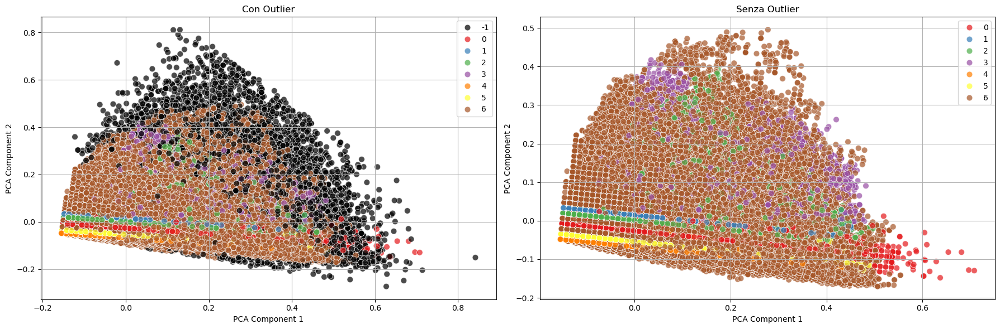

In [13]:
# ======== 5b. Visualizzazione 2D con PCA con e senza outliers, grafici affiancati ========
# PCA
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_matrix_scaled)

# Caricamento cluster
clusters = np.load('hdbscan_clusters_strutturale_5f.npy')
outlier_mask = clusters == -1
cluster_mask = clusters != -1

# Colori: solo per i cluster validi
unique_clusters = np.unique(clusters[cluster_mask])
palette = sns.color_palette("Set1", n_colors=len(unique_clusters))

# Costruisce una palette che associa etichetta intera a colore
cluster_palette = {label: color for label, color in zip(unique_clusters, palette)}
cluster_palette[-1] = "black"  # Colore per outlier

# === PLOT ===
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

# Con outlier
sns.scatterplot(
    x=features_pca[:, 0],
    y=features_pca[:, 1],
    hue=clusters,
    palette=cluster_palette,
    s=60,
    alpha=0.7,
    ax=axs[0],
    legend='full'
)
axs[0].set_title("Con Outlier")
axs[0].set_xlabel("PCA Component 1")
axs[0].set_ylabel("PCA Component 2")
axs[0].grid(True)

# Senza outlier
sns.scatterplot(
    x=features_pca[cluster_mask, 0],
    y=features_pca[cluster_mask, 1],
    hue=clusters[cluster_mask],
    palette=cluster_palette,
    s=60,
    alpha=0.7,
    ax=axs[1],
    legend='full'
)
axs[1].set_title("Senza Outlier")
axs[1].set_xlabel("PCA Component 1")
axs[1].set_ylabel("PCA Component 2")
axs[1].grid(True)

plt.tight_layout()
plt.show()

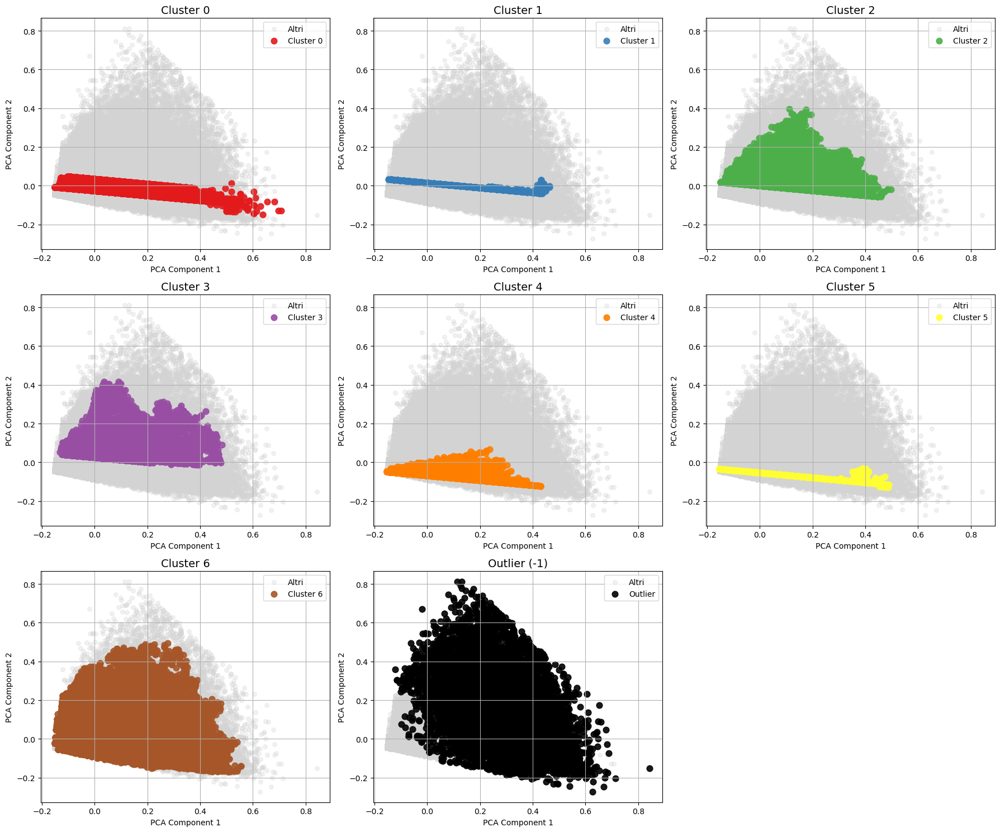

In [14]:
# ======== 5c. Visualizzazione dei singoli cluster con PCA 2D, grafici affiancati ========
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math

# Cluster unici (inclusi -1 per outlier)
unique_clusters = np.unique(clusters)

# Colori: palette per cluster normali, colore specifico per outlier
valid_clusters = [c for c in unique_clusters if c != -1]
palette = sns.color_palette("Set1", n_colors=len(valid_clusters))
cluster_palette = {label: color for label, color in zip(valid_clusters, palette)}
cluster_palette[-1] = "black"  # Outlier evidenziati in nero

# Ordina per avere outlier alla fine o in una posizione definita
clusters_to_plot = valid_clusters + [-1]

# Layout grid
n_cols = 3
n = len(clusters_to_plot)
n_rows = math.ceil(n / n_cols)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axs = axs.flatten()

for idx, cluster_id in enumerate(clusters_to_plot):
    ax = axs[idx]

    # Maschera per punti NON del cluster corrente
    mask_others = clusters != cluster_id
    ax.scatter(
        features_pca[mask_others, 0],
        features_pca[mask_others, 1],
        c="lightgray",
        s=30,
        alpha=0.3,
        label="Altri"
    )

    # Maschera per punti del cluster corrente (compresi outlier)
    mask_current = clusters == cluster_id
    ax.scatter(
        features_pca[mask_current, 0],
        features_pca[mask_current, 1],
        c=[cluster_palette[cluster_id]],
        s=60,
        alpha=0.9,
        label=f"Cluster {cluster_id}" if cluster_id != -1 else "Outlier"
    )

    title = f"Cluster {cluster_id}" if cluster_id != -1 else "Outlier (-1)"
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("PCA Component 1")
    ax.set_ylabel("PCA Component 2")
    ax.grid(True)
    ax.legend()

# Rimuove sottografici vuoti
for i in range(n, len(axs)):
    fig.delaxes(axs[i])

plt.tight_layout()
plt.show()

Quindi la **PCA** è veloce dando un'idea generale, ed è utile anche per il clustering stesso. Notare che il **cluster -1** sono gli **outlier** rilevati da DBSCAN.

**Nota**: provato ad utilizzare t-SNE ma richiede più di 1h per ottenere il grafico (se usiamo il train set).

---

---

## **<span style="color:purple">Approfondimento dell'analisi aggiungendo informazioni sul contenuto</span>**

### <span style="color:blue">Estrazione Features Contenuto</span>

Per estrarre **informazioni sul contenuto delle tabelle** (testo, numeri, simboli) dai file JSON nella cartella `words`, si può analizzare il campo `"text"` di ogni elemento nel file JSON. 
Nello specifico si vuole creare una rappresentazione vettoriale più ricca che includa le percentuali di lettere, numeri e simboli (anziché una sola feature categorica). Per farlo si modifica la funzione `extract_features` per calcolare le proporzioni di ogni tipo di carattere nel testo della tabella. Questo è possibile farlo analizzando il contenuto nel seguente modo:
1. Si conta il numero totale di caratteri (lettere, numeri, simboli) in tutto il testo della tabella.
2. Si calcola la percentuale di ciascuna categoria rispetto al totale.

Così, si arricchisce la **rappresentazione Vettoriale** andando ad aggiungere tre nuove features alla matrice: `percent_letters`, `percent_numbers`, `percent_symbols`.

#### Codice per estrarre informazioni strutturali e di contenuto dai file XML e JSON:

In [15]:
import os # Fa parte della libreria std di python
import xml.etree.ElementTree as ET  # Fa parte della libreria std di python
import json  # Fa parte della libreria std di python
import re  # Fa parte della libreria std di python
import numpy as np

def classify_content(text): # Restituisce il conteggio assoluto di lettere, numeri e simboli per ogni stringa di testo.
    # Conta lettere, numeri e simboli (inclusi spazi e punteggiatura)
    num_letters = sum(c.isalpha() for c in text) # Conta ogni singola lettera, una per una
    num_digits = sum(c.isdigit() for c in text) # Conta ogni singola cifra
    num_symbols = len(text) - num_letters - num_digits  # Tutto il resto
    
    return num_letters, num_digits, num_symbols

def extract_features(xml_file, words_folder): # Calcola le percentuali di lettere, numeri e simboli rispetto al totale dei caratteri nella tabella. Se la tabella è vuota (`total_chars = 0`), assegna `0.0` a tutte le percentuali.
    # Estrai le caratteristiche strutturali dal file XML
    tree = ET.parse(xml_file)
    root = tree.getroot()
    
    num_rows = len(root.findall(".//object[name='table row']"))
    num_cols = len(root.findall(".//object[name='table column']"))
    num_spanning_cells = len(root.findall(".//object[name='table spanning cell']"))
    #num_column_headers = len(root.findall(".//object[name='table column header']"))
    num_projected_row_headers = len(root.findall(".//object[name='table projected row header']"))
    
    # Inizializza i contatori per lettere, numeri e simboli
    total_letters = 0
    total_numbers = 0
    total_symbols = 0
    
    # Estrai il contenuto dal file JSON corrispondente
    base_name = os.path.splitext(os.path.basename(xml_file))[0]
    json_file = os.path.join(words_folder, f"{base_name}_words.json")
    
    if os.path.exists(json_file):
        with open(json_file, 'r') as f:
            data = json.load(f)
            for item in data:
                text = item.get('text', '') # Serve per analizzare il contenuto del campo testo
                letters, numbers, symbols = classify_content(text)
                total_letters += letters
                total_numbers += numbers
                total_symbols += symbols
    
    # Calcola le percentuali
    total_chars = total_letters + total_numbers + total_symbols
    if total_chars > 0:
        percent_letters = total_letters / total_chars
        percent_numbers = total_numbers / total_chars
        percent_symbols = total_symbols / total_chars
    else:
        percent_letters = 0.0
        percent_numbers = 0.0
        percent_symbols = 0.0
    
    # Ritorna tutte le features (strutturali + contenuto)
    return (
        num_rows, num_cols, num_spanning_cells, 
        #num_column_headers, 
        num_projected_row_headers,
        percent_letters, percent_numbers, percent_symbols
    )

# Percorsi delle cartelle
# NB questi percorsi potrebbero essere diversi se si è appena scaricato PubTables 
# (potrebbero essere potrebbe essere necessario accedere a una directory interna in più)
#xml_folder_path = 'PubTables-1M/test' # Qui ci sono poche tabelle (circa 95 mila)
xml_folder_path = 'PubTables-1M/train' # In questo modo si usa tutte le tabelle presenti in PubTables-1M in train che sono 758.849 tabelle
words_folder_path = 'PubTables-1M/words' # Qui ci sono tutte le tabelle (circa 1 milione)

# Ottieni la lista di tutti i file XML nella cartella
xml_files = [os.path.join(xml_folder_path, f) for f in os.listdir(xml_folder_path) if f.endswith('.xml')]

# Estrai le features per tutte le tabelle (adesso estrae anche il nome della tabella)
#features_list = [extract_features(xml_file, words_folder_path) for xml_file in xml_files] # Così estrae le features ma senza nome
features_list = []
file_names = []

# Ciclo for per estrarre le features e per estrarre i nomi dei file
for xml_file in xml_files:
    features = extract_features(xml_file, words_folder_path)
    features_list.append(features) # Salva le features
    file_names.append(os.path.splitext(os.path.basename(xml_file))[0])  # Salva il nome base senza estensione

# Crea la matrice delle features
features_matrix = np.array(features_list)

# Salva la matrice
np.save('features_matrix_with_content_percentages.npy', np.array(features_list)) # Salva la matrice delle features
np.save('features_file_names.npy', np.array(file_names)) # Salva i nomi

Eseguendo il codice precedente si ottiene la matrice delle features che avrà 8* colonne:
- Prime 5*: ***features strutturali*** (righe, colonne, celle estese, column header, projected row header).
- Ultime 3: ***features contenuto*** (percent_letters, percent_numbers, percent_symbols con valori in [0, 1]).

Notare che prima il codice **estraeva solo le features strutturali** e le salvava in `features_matrix`, mentre ora abbiamo anche le features di contenuto. Nel codice precedente **si salva parallelamente i nomi base dei file XML** in `file_names`.

**NBB** per contare il numero di lettere si **conta il numero di caratteri che sono lettere**, **NON** il numero di parole. Per contare i numeri si **conta il numero di cifre**, **NON** il numero di numeri interi o reali. Per i simboli **tutto ciò che non è né lettera né cifra** viene contato come simbolo (compresi spazi, punteggiatura, caratteri speciali).

⚠<span style="color:red">**Nota Bene**: Il conteggio della feature *"table column header"* è stato commentato (cioè escluso) dall’analisi per le osservazioni indicate nella precedente sezione di analisi. Verrà indicato con '*' quando nell'analisi è stato cambiato il numero di features per queste osservazioni. Anche in questo caso sono state lasciate le analisi precedenti che includevano questa features strutturale in più.</span>

Quindi in realtà Eseguendo il codice precedente si ottiene la matrice delle features che avrà 7* colonne:
- Prime 4*: ***features strutturali*** (righe, colonne, celle estese, projected row header).
- Ultime 3: ***features contenuto*** (percent_letters, percent_numbers, percent_symbols con valori in [0, 1]).

---

#### Normalizzazione:

Per rendere tutte le feature confrontabili, visto che vogliamo fare clustering, usare FAISS (basato su distanze) e usare PCA, anche la nuova matrice delle features ottenuta aggiungendo le informazioni sul contenuto viene normalizzata. Si normalizza quindi utilizzando MinMaxScaler() a tutta la matrice inclusi i valori di percentuali, così:

In [16]:
from sklearn.preprocessing import MinMaxScaler  # <--- cambia qui StandardScaler rispetto a prima che si aveva solo features strutturali
import numpy as np

# Carica le feature
features_matrix = np.load('features_matrix_with_content_percentages.npy')

# Applica MinMaxScaler
scaler = MinMaxScaler()
features_matrix_scaled = scaler.fit_transform(features_matrix)

# Salva la matrice normalizzata
np.save('features_matrix_with_content_percentages_scaled.npy', features_matrix_scaled)

Con **MinMaxScaler** ogni feature sarà scalata nell’intervallo [0, 1], mantenendo la forma della distribuzione. Questo può aiutare DBSCAN (che è sensibile alla scala) a comportarsi meglio se le feature hanno range molto diversi come nel caso in esame in quanto abbiamo che le features relative al contenuto sono delle percentuali (tra 0 e 1), mentre le features strutturali sono dei conteggi (tra 0 e un numero intero elevato).

---

#### Grafico della Distribuzione del contenuto delle tabelle
Di seguito il grafico per visualizzare la distribuzione delle percentuali di **lettere**, **numeri** e **simboli** su tutte le tabelle.

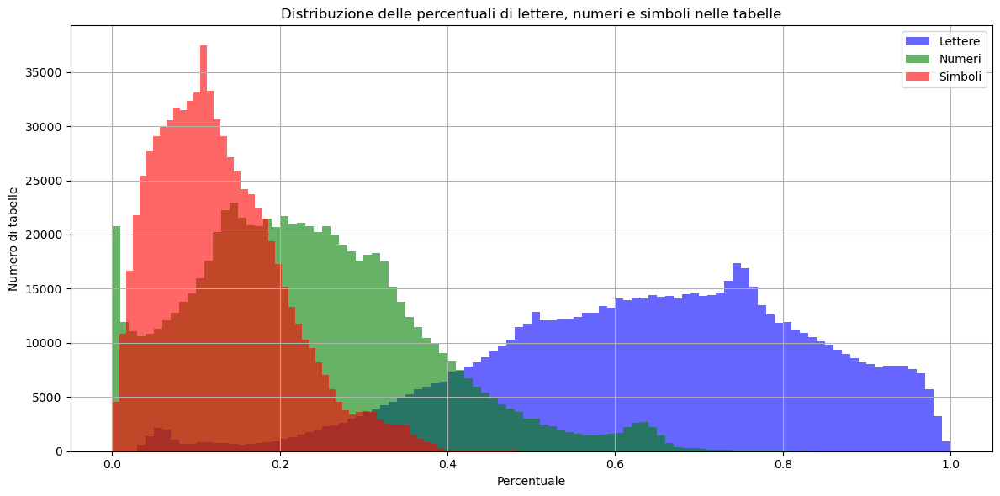

In [17]:
import matplotlib.pyplot as plt

features_matrix = np.load('features_matrix_with_content_percentages.npy') # Carica la matrice con le percentuali

# Estrai solo le colonne con le percentuali # Se 8 features
#percent_letters = features_matrix[:, 5]
#percent_numbers = features_matrix[:, 6]
#percent_symbols = features_matrix[:, 7]

# Estrai solo le colonne con le percentuali # Se 7 features
percent_letters = features_matrix[:, 4]
percent_numbers = features_matrix[:, 5]
percent_symbols = features_matrix[:, 6]

# Imposta il numero di bins
bins = 100 # È come vengono raggruppate le tabelle

# Crea il grafico
plt.figure(figsize=(12, 6))
plt.hist(percent_letters, bins=bins, alpha=0.6, label='Lettere', color='blue')
plt.hist(percent_numbers, bins=bins, alpha=0.6, label='Numeri', color='green')
plt.hist(percent_symbols, bins=bins, alpha=0.6, label='Simboli', color='red')

plt.title('Distribuzione delle percentuali di lettere, numeri e simboli nelle tabelle')
plt.xlabel('Percentuale')
plt.ylabel('Numero di tabelle')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

---

### <span style="color:blue">Ricerca tabelle simili in base alla struttura e al contenuto</span>

Adesso vogliamo sfruttare la nuova matrice delle features con 8* (in realtà 7) dimensioni per ricercare tabelle simili strutturalmente e nel contenuto.
Per farlo si sfrutta lo stesso procedimento utilizzato nell'analisi precedente e quidni si applica FAISS.

#### FAISS per la ricerca di tabelle simili

In [18]:
import faiss
import numpy as np

features_matrix = np.load('features_matrix_with_content_percentages_scaled.npy')

# Normalizzazione L2 (necessaria per usare la cosine similarity):
norms = np.linalg.norm(features_matrix, axis=1, keepdims=True)
features_matrix_l2 = features_matrix / norms

# Costruisci l’indice di similarita usando Inner Product (IP) utile per similarità cosine
index2 = faiss.IndexFlatIP(features_matrix_l2.shape[1])
index2.add(features_matrix_l2)

# Trova i top 6 vicini (per escludere l’identico)
top_k2 = 6
D2, I2 = index2.search(features_matrix_l2, top_k2)

# Escludi la prima colonna (autosimilarità)
D2 = D2[:, 1:]
I2 = I2[:, 1:]

# Salva i risultati
np.save('top5_similarities_with_content.npy', D2)
np.save('top5_indices_with_content.npy', I2)

Per vedere un esempio di tabella simile si può utilizzare il seguente codice. Notare che il seguente codice trova tabelle simili in base all'indice.

In [19]:
file_names = np.load('features_file_names.npy')

# Esempio: stampa le 5 tabelle più simili alla tabella 13
#index_of_table = 0
table_id2 = 13
similar_ids = I2[table_id2]
print(f"Tabelle più simili a {file_names[table_id2]}:")
for i, sim_idx in enumerate(similar_ids):
    print(f"{i+1}. {file_names[sim_idx]} (similarità: {D2[table_id2][i]:.4f})")

Tabelle più simili a PMC1064097_table_0:
1. PMC3448506_table_0 (similarità: 1.0000)
2. PMC4512109_table_0 (similarità: 1.0000)
3. PMC5144651_table_6 (similarità: 1.0000)
4. PMC3585701_table_0 (similarità: 1.0000)
5. PMC4735307_table_0 (similarità: 1.0000)


Se si vuole cercare le tabelle simili partendo dal nome della tabella (anziché dal suo indice come si faceva prima), basta trovare l'indice associato a quel nome nella lista file_names. Di seguito è presentato il codice che permette di cercare le prime 5 tabelle più simili a una tabella passata per nome. Inoltre vengono restituite le immagini e le features delle tabelle trovate. 

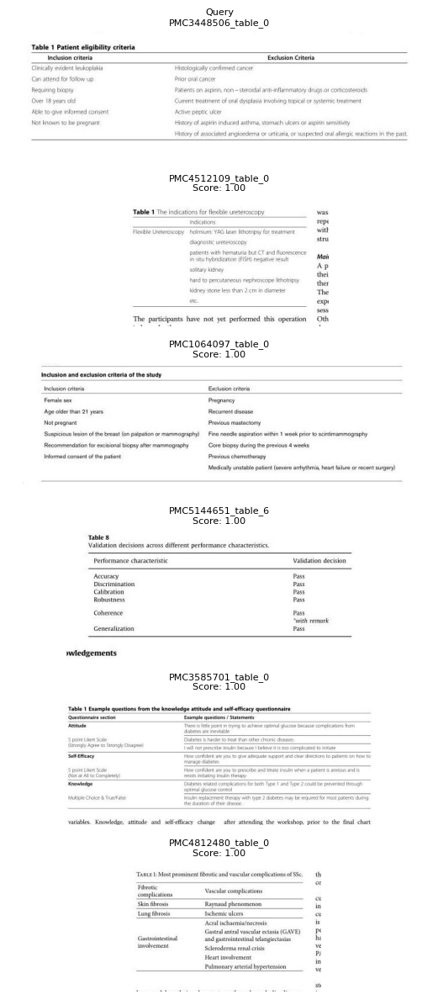

Features della query:
[0.08333333 0.         0.01408451 0.         0.98305085 0.00564972
 0.01398687]

Features delle top 5 simili:
1) PMC4512109_table_0 - Score: 1.00
[0.08333333 0.         0.01408451 0.         0.98195876 0.00515464
 0.01595152]
2) PMC1064097_table_0 - Score: 1.00
[0.08333333 0.         0.01408451 0.         0.98051948 0.00865801
 0.01339651]
3) PMC5144651_table_6 - Score: 1.00
[0.08333333 0.         0.01408451 0.         0.98678414 0.00440529
 0.01090606]
4) PMC3585701_table_0 - Score: 1.00
[0.08333333 0.         0.01408451 0.         0.97905759 0.00628272
 0.01814631]
5) PMC4812480_table_0 - Score: 1.00
[0.08333333 0.         0.01408451 0.         0.9826087  0.00289855
 0.01793968]


In [20]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Percorso immagini
image_dir = 'PubTables-1M/images/'

# Carica dati FAISS
I2 = np.load('top5_indices_with_content.npy')       # shape: (n_tabelle, 5)
D2 = np.load('top5_similarities_with_content.npy')  # shape: (n_tabelle, 5)
file_names = np.load('features_file_names.npy') 
features_matrix = np.load('features_matrix_with_content_percentages_scaled.npy')

# Tabella query (per nome, es. "PMC3448506_table_0")
query_name = 'PMC3448506_table_0'

# Trova l'indice della query nella lista dei file
try:
    query_idx = np.where(file_names == query_name)[0][0]
except IndexError:
    print(f"Tabella {query_name} non trovata!")
    exit()

# Recupera gli indici e punteggi delle 5 più simili
similar_indices2 = I2[query_idx]
similar_scores2 = D2[query_idx]

# Mostra query + 5 simili
fig, axes = plt.subplots(6, 1, figsize=(6, 12))

# Visualizza la query
query_img_path = os.path.join(image_dir, f'{query_name}.jpg')
query_img = Image.open(query_img_path)
axes[0].imshow(query_img, cmap='gray')
axes[0].set_title("Query\n" + query_name, fontsize=8)
axes[0].axis('off')

# Visualizza le top 5 simili
for i in range(5):
    idx = similar_indices2[i]
    sim_name = file_names[idx]
    sim_score = similar_scores2[i]
    sim_img_path = os.path.join(image_dir, f'{sim_name}.jpg')
    
    try:
        sim_img = Image.open(sim_img_path)
        axes[i+1].imshow(sim_img, cmap='gray')
        axes[i+1].set_title(f"{sim_name}\nScore: {sim_score:.2f}", fontsize=8)
    except FileNotFoundError:
        axes[i+1].text(0.5, 0.5, "Img not found", ha='center', va='center')
    
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()

print("Features della query:")
print(features_matrix[query_idx])

print("\nFeatures delle top 5 simili:")
for i, idx in enumerate(similar_indices2):
    print(f"{i+1}) {file_names[idx]} - Score: {similar_scores2[i]:.2f}")
    print(features_matrix[idx])

Visualizzando le immagini jpg delle top-k tabelle più simili rispetto alla tabella di esempio ottenute dal calcolo dell'inidce FAISS, possiamo notare che tutte hanno valori delle features più o meno uguali.
Notare sempre che i valori delle features risultano essere normalizzati con MinMax Scaler e per questo non sono valori interi. 

Possiamo inoltre notare che rispetto al caso delle sole features strutturali, se adesso usiamo anche le features di contenuto le tabelle risultano essere visivamente più simili tra loro. Questo miglioramento è dovuto alle features di contenuto che indicano la percentuale del tipo di dato contenuto nella tabella (nell'esempio precedente è principalmente testuale, circa il 98%).

### <span style="color:blue">Clusterizzazione in base alla struttura e contenuto</span>

A questo punto si attua una nuova clusterizzazione per vedere se otteniamo più o meno outliers o se otteniamo lo stesso risultato rispetto al caso precedente.

Avendo già una pipeline ben strutturata, si riutillizza applicando così la stessa analisi con la nuova matrice delle features (quella che include anche le percentuali di lettere/numeri/simboli).

#### 1. Caricamento della nuova feature matrix scalata

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

# ======== 1. Caricamento della feature matrix new normalizzata ========
features_matrix_scaled = np.load('features_matrix_with_content_percentages_scaled.npy')

#### 2. Scelta dei parametri MinPts e eps di DBSCAN

##### Scelta del parametro MinPts di DBSCAN

Dovendo rispettare la notazione `min_samples = dim * 2`, allora in questo caso si ha **8'*' feature strutturali** (in realtà 7) ⇒ `min_samples = 16`* (in realtà 14).

##### Stimare il parametro eps di DBSCAN con K-distance plot

Questo blocco rimane esattamente invariato, si deve solo assicurare che la variabile `features_matrix_scaled` sia quella aggiornata (cioè caricata nel punto 1). 

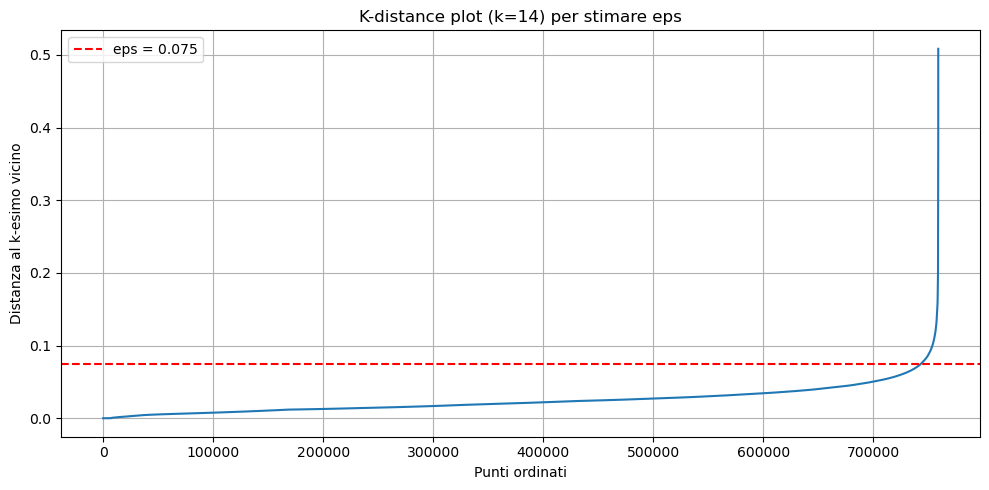

In [22]:
# ======== 2. Stima eps con K-distance plot (facoltativo) ========
# min_samples scelto in base al dominio o esperimenti (tipico: 5-10)
#min_samples = 16 # Cambiato rispetto a prima # Se 8 features
min_samples = 14 # Se 7 features
k = min_samples - 1

neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors_fit = neighbors.fit(features_matrix_scaled)
distances, indices = neighbors_fit.kneighbors(features_matrix_scaled)
k_distances = np.sort(distances[:, k])

plt.figure(figsize=(10, 5))
plt.plot(k_distances)
plt.title(f"K-distance plot (k={k+1}) per stimare eps")
plt.xlabel("Punti ordinati")
plt.ylabel("Distanza al k-esimo vicino")
plt.grid(True)
# Aggiunge la linea rossa orizzontale per eps scelto
#eps_scelto = 0.12  # <-- qui il valore di eps scelto test set # Se 8 features
#eps_scelto = 0.08  # <-- qui il valore di eps scelto train # Se 8 features
eps_scelto = 0.075  # <-- qui il valore di eps scelto train # Se 7 features
plt.axhline(y=eps_scelto, color='red', linestyle='--', label=f'eps = {eps_scelto}')
plt.legend() # Aggiunge legenda
plt.tight_layout()
plt.show()

Riferiti al caso con 8 Features:
- Si può notare che in questo il gomito si forma a circa un ***eps pari a 0.12 nel test set***. (Se uso normalizzazione StandardScaler eps = 1.2). L'***eps è pari a 0.08 nel train set***.

Riferiti al caso con 7 features:
- In questo caso il gomito si forma con un ***eps pari a 0.075 nel train set***.

#### 3. Applicazione DBSCAN

Si cambia la features matrix da caricare e poi si esegue DBSCAN come prima, modificando `eps` in base al tuo nuovo K-distance plot.

In [23]:
# ======== 3. Clustering con DBSCAN ========
"""
features_matrix_scaled = np.load('features_matrix_with_content_percentages_scaled.npy') # Carica la matrice scalata

# Imposta eps secondo il gomito nel grafico precedente (modifica qui sotto!)
# Se uso MinMaxScaler eps=0.11, se uso StandardScaler eps=1.1
dbscan = DBSCAN(eps=0.12, min_samples=min_samples)  # Scegliere `eps` in base al plot (Se uso normalizzazione MinMax eps = 0.11) se Standardscaler eps 1.1
clusters = dbscan.fit_predict(features_matrix_scaled)
np.save('dbscan_clusters_strutturale+contenuto_8f.npy', clusters) # Salvo solo le etichette
"""

"\nfeatures_matrix_scaled = np.load('features_matrix_with_content_percentages_scaled.npy') # Carica la matrice scalata\n\n# Imposta eps secondo il gomito nel grafico precedente (modifica qui sotto!)\n# Se uso MinMaxScaler eps=0.11, se uso StandardScaler eps=1.1\ndbscan = DBSCAN(eps=0.12, min_samples=min_samples)  # Scegliere `eps` in base al plot (Se uso normalizzazione MinMax eps = 0.11) se Standardscaler eps 1.1\nclusters = dbscan.fit_predict(features_matrix_scaled)\nnp.save('dbscan_clusters_strutturale+contenuto_8f.npy', clusters) # Salvo solo le etichette\n"

Anche in questo caso se uso il train set avrò problemi di memoria, per questo di seguito implementato HDBSCAN

#### 3b. Applicazione HDBSCAN

I parametri di HDBSCAN che vengono utilizzati sono i seguenti:
- `min_cluster_size`: indica quante istanze al minimo si vuole in un cluster, e dipende dalla granularità che si cerca. Si vuole evitare cluster piccoli e comunque poter analizzare gli outliers.
- `min_samples`: si utilizza **dimensione_feature * 2** poichè scelto come notazione anche per DBSCAN, quindi min_samples = 16* (in realtà 14).
- `cluster_selection_epsilon`: si sceglie guardando la k-distanze plot in modo simile a come abbiamo scelto eps, in quanto dall'analisi precedente è risultato la scelta corretta da fare.

**Riferiti a 8 features:**
Per verificare che i parametri scelti fossero i migliori da utilizzare, il codice è stato eseguito utilizzando diversi parametri i cui risultati vengono riassunti nella seguente tabella:

| **min\_cluster\_size** | **cluster\_selection\_epsilon** | **# Cluster** | **Cluster min size** | **Outliers**   |
| ---------------------- | ------------------------------- | ------------- | -------------------- | -------------- |
| 10                     | 0.080                           | 3             | 11                   | Sì, a sinistra |
| 12                     | 0.080                           | 2             | ≥12                  | No             |
| 12                     | 0.065                           | 2             | ≥12                  | No             |
| 10                     | 0.045                           | 3             | 11                   | Sì, a sinistra |
| 25                     | 0.045                           | 2             | ≥25                  | No             |
| 10                     | 0.035                           | 7             | 11                   | Sì, a sinistra |
| 25                     | 0.035                           | 3             | 587                  | Sì, a sinistra |
| 38                     | 0.035                           | 3             | 587                  | Sì, a sinistra |

Dalla tabella si nota che min_cluster_size basso (10) genera sempre più di 2 cluster. Con min_cluster_size medio (12–25) se epsilon è moderato (0.045–0.065), si ottengono 2 cluster ben definiti senza outliers, mentre con epsilon molto basso (0.035), cominciano a riemergere gli outliers anche con min_cluster_size più alti. Con min_cluster_size alto (25–38) si ottiene cluster molto grandi (min 587), comunque si continua a produrre outliers a epsilon basso, ma aggrega molte più tabelle in ciascun cluster.
Quindi per analizzare gli outliers, similmente alla scelta fatta nell'analisi precedente, sono stati scelti i parametri che permettono di avere cluster grandi e comunque poter studiare gli outliers, di conseguenza i valori scelti sono `min_cluster_size = 38` e `epsilon = 0.035`. Da notare che questa scelta è congruente ai parametri scelti precedentemente per l'esecuzione di HDBSCAN.

**Riferiti a 7 features:**
In questo caso si ha:

| **min\_cluster\_size** | **cluster\_selection\_epsilon** | **# Cluster** | **Cluster min size** | **Outliers**   |
| ---------------------- | ------------------------------- | ------------- | -------------------- | -------------- |
| 38                     | 0.030                           | 2             | 8242                  | 145643 |
| 38                     | 0.075                           | 2             | 8242                  | Troppi! |
| 38                     | 0.020                           | 18             | 46, 48, 66, 85                  | ancora tanti (396177) |
| 100                     | 0.015                           | 24             | 127                  | tanti 423668 |
| 100                     | 0.025                           | 4             | 414                  | tanti ma meno di prima 302326 |
| 100                     | 0.027                           | 2             | 8242                  | 145643 meglio |
| 100                     | 0.029                           | 2             | 8242                  | 145643 |
| 14                     | 0.035                           | 5             | 16, 17, 22                  | 145588 |
| 100                     | 0.035                           | 2             | 8242                  | 145643 |

Quindi per analizzare gli outliers, similmente alla scelta fatta nell'analisi precedente, sono stati scelti i parametri che permettono di avere cluster grandi e comunque poter studiare gli outliers, di conseguenza i valori scelti sono `min_cluster_size = 100` e `epsilon = 0.035`. Da notare che questa scelta è congruente ai parametri scelti precedentemente per l'esecuzione di HDBSCAN.

In [24]:
# ======== 3b. Clustering con HDBSCAN ========
import hdbscan

#min_samples = 16 # dim*2 => 8*2 = 16 # Se 8 features
min_samples = 14 # dim*2 => 7*2 = 14 # Se 7 features

hdbscan = hdbscan.HDBSCAN(min_cluster_size=100, min_samples=min_samples, cluster_selection_epsilon=0.035, metric='euclidean')
clusters = hdbscan.fit_predict(features_matrix_scaled)
np.save('hdbscan_clusters_strutturale+contenuto_8f.npy', clusters)

C:\Users\giost\anaconda3\envs\DM\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\giost\anaconda3\envs\DM\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


#### 4. Istogramma per mostrare il numero di tabelle in ciascun cluster

Questo blocco va bene come era prima, dato che lavora solo sulle label `clusters`.

Numero di tabelle per cluster:
Cluster -1: 145643 tabelle
Cluster 0: 8242 tabelle
Cluster 1: 604964 tabelle


C:\Users\giost\AppData\Local\Temp\ipykernel_15308\3368705664.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=unique_clusters, y=counts, palette="viridis")


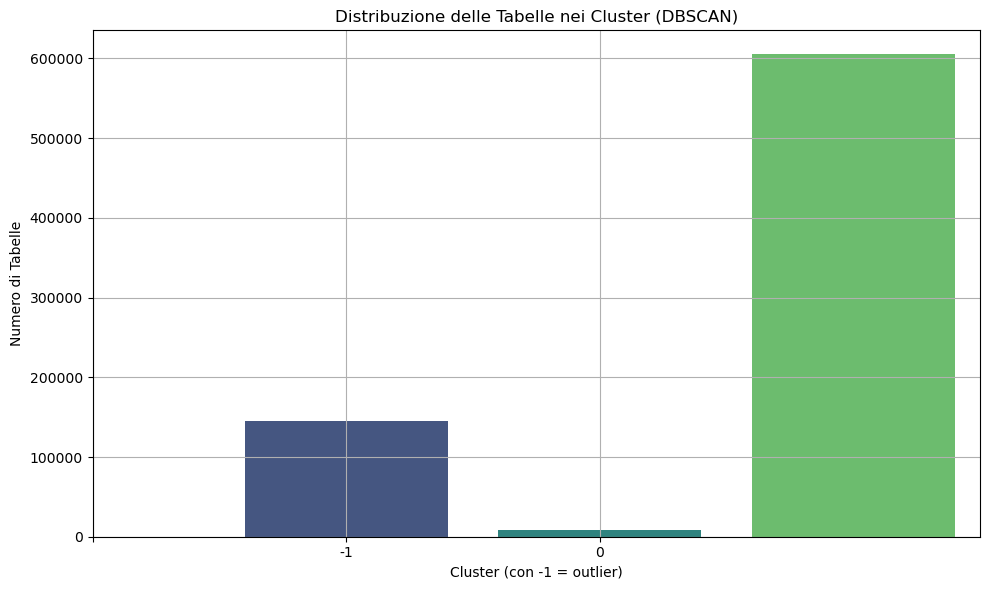

In [25]:
# ======== 4. Istogramma: numero di tabelle per cluster ========
#clusters = np.load('dbscan_clusters_strutturale+contenuto_8f.npy') # Ricarico le etichette in modo da poterle usare
clusters = np.load('hdbscan_clusters_strutturale+contenuto_8f.npy') # Ricarico le etichette HDBSCAN in modo da poterle usare

unique_clusters, counts = np.unique(clusters, return_counts=True)

# Stampa il numero di elementi per ogni cluster
print("Numero di tabelle per cluster:")
for cluster, count in zip(unique_clusters, counts):
    print(f"Cluster {cluster}: {count} tabelle")

plt.figure(figsize=(10, 6))
sns.barplot(x=unique_clusters, y=counts, palette="viridis")
plt.title("Distribuzione delle Tabelle nei Cluster (DBSCAN)")
plt.xlabel("Cluster (con -1 = outlier)")
plt.ylabel("Numero di Tabelle")
plt.xticks(unique_clusters)
plt.grid(True)
plt.tight_layout()
plt.show()

Notare che aumentano gli outliers nel caso in cui si considerino anche le informazioni di contenuto delle tabelle. Inoltre il numero di cluster diminuisce non avendo più cluster uniformemente numerosi.

#### 5. PCA per visualizzazione 2D

Anche in questo caso si cambia solo la metrice delle features usata per far si che abbia le percentuali incluse. Per fare la visualizzazione 2D è stata utilizzata la PCA poichè restituisce una visualizzazione in tempi relativamente brevi.

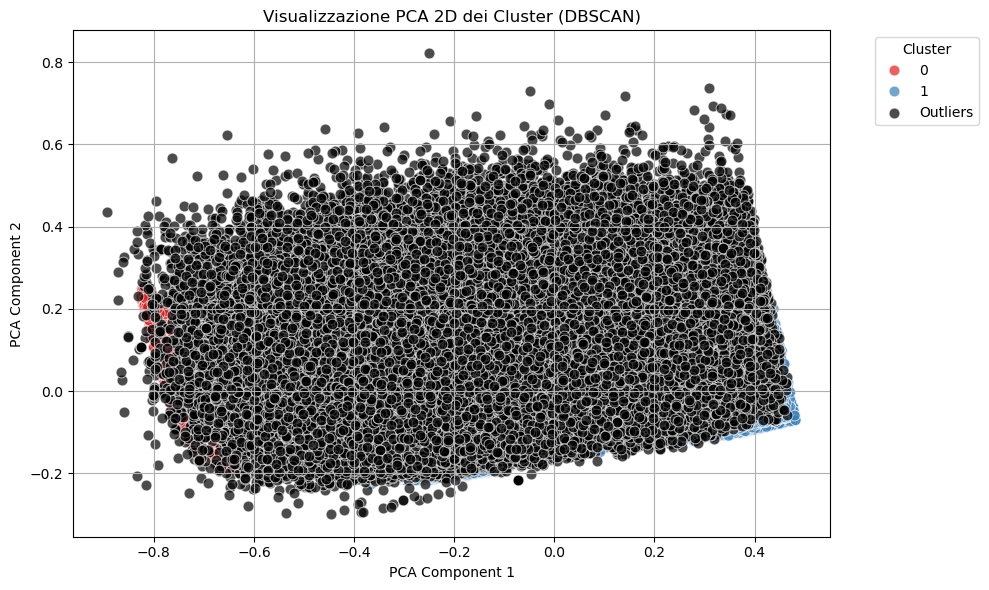

In [26]:
# ======== 5. Visualizzazione 2D con PCA ========
# Carica i dati
#clusters = np.load('dbscan_clusters_strutturale+contenuto_8f.npy') # Usa etichette di DBSCAN
clusters = np.load('hdbscan_clusters_strutturale+contenuto_8f.npy') # Ricarico le etichette HDBSCAN in modo da poterle usare

pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_matrix_scaled)

# Crea una figura
plt.figure(figsize=(10, 6))

# Maschere per outlier e cluster veri
outlier_mask = clusters == -1
cluster_mask = clusters != -1

# Plot dei cluster normali (cerchi colorati)
sns.scatterplot(
    x=features_pca[cluster_mask, 0],
    y=features_pca[cluster_mask, 1],
    hue=clusters[cluster_mask],
    palette="Set1",
    s=60,
    alpha=0.7,
    legend='full',
)

# Plot degli outlier (X nere)
sns.scatterplot(
    x=features_pca[outlier_mask, 0],
    y=features_pca[outlier_mask, 1],
    color='black',
    s=60,
    alpha=0.7,
    label='Outliers'
)

plt.title("Visualizzazione PCA 2D dei Cluster (DBSCAN)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

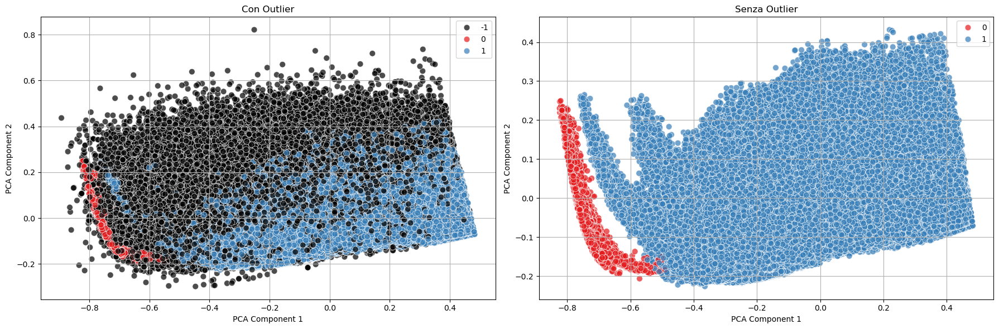

In [27]:
# ======== 5b. Visualizzazione 2D con PCA con e senza outliers, grafici affiancati ========
# PLOT con e senza outlier 
fig, axs = plt.subplots(1, 2, figsize=(18, 6))

# Con outlier
sns.scatterplot(
    x=features_pca[:, 0],
    y=features_pca[:, 1],
    hue=clusters,
    palette=cluster_palette,
    s=60,
    alpha=0.7,
    ax=axs[0],
    legend='full'
)
axs[0].set_title("Con Outlier")
axs[0].set_xlabel("PCA Component 1")
axs[0].set_ylabel("PCA Component 2")
axs[0].grid(True)

# Senza outlier
sns.scatterplot(
    x=features_pca[cluster_mask, 0],
    y=features_pca[cluster_mask, 1],
    hue=clusters[cluster_mask],
    palette=cluster_palette,
    s=60,
    alpha=0.7,
    ax=axs[1],
    legend='full'
)
axs[1].set_title("Senza Outlier")
axs[1].set_xlabel("PCA Component 1")
axs[1].set_ylabel("PCA Component 2")
axs[1].grid(True)

plt.tight_layout()
plt.show()

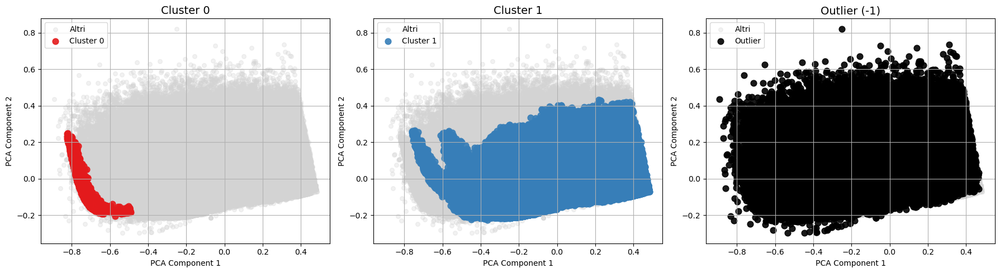

In [28]:
# ======== 5c. Visualizzazione dei singoli cluster con PCA 2D, grafici affiancati ========
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math

# Cluster unici (inclusi -1 per outlier)
unique_clusters = np.unique(clusters)

# Colori: palette per cluster normali, colore specifico per outlier
valid_clusters = [c for c in unique_clusters if c != -1]
palette = sns.color_palette("Set1", n_colors=len(valid_clusters))
cluster_palette = {label: color for label, color in zip(valid_clusters, palette)}
cluster_palette[-1] = "black"  # Outlier evidenziati in nero

# Ordina per avere outlier alla fine o in una posizione definita
clusters_to_plot = valid_clusters + [-1]

# Layout grid
n_cols = 3
n = len(clusters_to_plot)
n_rows = math.ceil(n / n_cols)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axs = axs.flatten()

for idx, cluster_id in enumerate(clusters_to_plot):
    ax = axs[idx]

    # Maschera per punti NON del cluster corrente
    mask_others = clusters != cluster_id
    ax.scatter(
        features_pca[mask_others, 0],
        features_pca[mask_others, 1],
        c="lightgray",
        s=30,
        alpha=0.3,
        label="Altri"
    )

    # Maschera per punti del cluster corrente (compresi outlier)
    mask_current = clusters == cluster_id
    ax.scatter(
        features_pca[mask_current, 0],
        features_pca[mask_current, 1],
        c=[cluster_palette[cluster_id]],
        s=60,
        alpha=0.9,
        label=f"Cluster {cluster_id}" if cluster_id != -1 else "Outlier"
    )

    title = f"Cluster {cluster_id}" if cluster_id != -1 else "Outlier (-1)"
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("PCA Component 1")
    ax.set_ylabel("PCA Component 2")
    ax.grid(True)
    ax.legend()

# Rimuove sottografici vuoti
for i in range(n, len(axs)):
    fig.delaxes(axs[i])

plt.tight_layout()
plt.show()

Visualizzando i dati in 2D possiamo farne una validazione visuale che è stata utilizzata per creare la tabella nella scelta dei parametri di HDBSCAN.

**Nota**: provato ad utilizzare t-SNE ma richiede più di 1h per ottenere il grafico (se usiamo il train set).

---

## **<span style="color:purple">Analisi dei Risultati</span>**

**Riferiti a 8 features:**
Possiamo notare che sia nella clusterizzazione per solo struttura che nella clusterizzazione per struttura e contenuto, le tabelle ricandono principalmente in 2 cluster. Il cluster 0 e il cluster 1. Quindi di seguito si analizza come sono strutturate principalmente le tabelle appartenenti a questi cluster e si vede invece gli outliers come sono strutturati. 
L'obbiettivo è vedere ogni classe (cluster) da che tipo di tabelle è composto.

**Riferiti a 7 features:** Possiamo notare che abbiamo differenze nelle clusterizzazioni ottimali di solo struttura e di struttura + contenuto: nel caso di clusterizzazione solo per struttura abbiamo la formazione di più di due cluster con un cluster che domina per popolosità sugli altri, mentre nel caso di clusterizzazione per struttura + contenuto le tabelle ricandono principalmente in 2 cluster (cluster 0 e 1) e si ha molti outliers. 
Quindi di seguito si analizza come sono strutturate principalmente le tabelle appartenenti a questi cluster ottenuti dalla clusterizzazione di struttura + contenuto e si vede gli outliers come sono strutturati. 
L'obbiettivo è vedere ogni classe (cluster) da che tipo di tabelle è composto.

### <span style="color:blue">Collegamento features tabella e nome tabella con Data Frame</span>

Per comodità nell'analisi si collega con un Data Frame di `padas` le features di una tabella con il suo nome. Questo processo è semplice da realizzare in quanto si è già salvato:
- `features_matrix_with_content_percentages.npy`, che contiene tutte le feature delle tabelle.
- `features_file_names.npy`, che contiene i nomi base dei file XML (senza estensione, es: `"PMC1234567_001"`).

In [29]:
import numpy as np
import pandas as pd

# Carica le features e i nomi dei file
features_matrix = np.load('features_matrix_with_content_percentages.npy')
file_names = np.load('features_file_names.npy', allow_pickle=True)

#clusters = np.load('dbscan_clusters_strutturale+contenuto_8f.npy')  # Etichette DBSCAN (si può usare per test set)
clusters = np.load('hdbscan_clusters_strutturale+contenuto_8f.npy') # Etichette HDBSCAN (da usare per train set)

# Colonne della matrice
columns = [
    "rows", "cols", "spanning_cells", 
    #"column_headers", "projected_row_headers", 
    "projected_row_headers",
    "% letters", "% numbers", "% symbols"
]

# Crea DataFrame
df_sc = pd.DataFrame(features_matrix, columns=columns)
df_sc['cluster'] = clusters
df_sc['file'] = file_names

Ora si ha un `DataFrame` (df_sc) in cui:
- Ogni riga è una tabella con le sue features strutturali e di contenuto.
- Si può filtrare facilmente per `cluster` o per nome di file.

### <span style="color:blue">Analisi cluster principali</span>

Si va ad analizzare quanti elementi ci sono per ogni cluster.

In [30]:
# Quanti elementi in ogni cluster?
print(df_sc['cluster'].value_counts())

cluster
 1    604964
-1    145643
 0      8242
Name: count, dtype: int64


Notare che il Cluster indicato come -1 rappresenta gli outliers.

Successivamente si controlla quali sono i valori minimi, medi e massimi delle feature per ogni nei cluster.

In [31]:
# Calcola il valore minimo, medio, massimo per ciascuna feature dei clusters

# Ottieni tutti i cluster tranne -1 (outliers)
cluster_ids = sorted(c for c in df_sc['cluster'].unique() if c != -1)

# Cicla su ogni cluster e stampa min, mean, max
for cluster_id in cluster_ids:
    cluster_data = df_sc[df_sc['cluster'] == cluster_id][columns]
    stats = cluster_data.agg(['min', 'mean', 'max'])
    print(f"\nCluster {cluster_id} - Statistiche (min, mean, max):")
    print(stats)


Cluster 0 - Statistiche (min, mean, max):
           rows      cols  spanning_cells  projected_row_headers  % letters  \
min    4.000000  6.000000        0.000000                    0.0   0.028014   
mean  21.382189  7.000121        0.000243                    0.0   0.064134   
max   47.000000  8.000000        2.000000                    0.0   0.238636   

      % numbers  % symbols  
min    0.506684   0.212121  
mean   0.625781   0.310085  
max    0.684870   0.377328  

Cluster 1 - Statistiche (min, mean, max):
           rows       cols  spanning_cells  projected_row_headers  % letters  \
min    1.000000   2.000000        0.000000               0.000000   0.078522   
mean  10.787642   4.920131        1.309615               0.375507   0.672054   
max   48.000000  16.000000       18.000000              11.000000   1.000000   

      % numbers  % symbols  
min    0.000000   0.000000  
mean   0.208135   0.119811  
max    0.684797   0.409594  


**Riferiti a 8 features:**
Da queste informazioni possiamo notare che i due cluster 0 e 1 non si differenziano molto a livello di contenuto avendo percentuali medie di contenuto molto simili (visibile guardando le medie). Inoltre possiamo notare come il cluster 0 corrisponda a tabelle strutturalmente più grandi rispetto a quelle del cluster 1.
Il cluster 2 è composto invece da tabelle abbastanza grandi (min righe 18 e min colonne 4) che hanno contenuto principalmente numerico (min %num = 0.44 e max %num = 0.56). Quindi il cluster 2 viene discriminato dal cluster 0 per la sua struttura che non contiene column_headers (come il cluster 1) e viene discriminato dal cluster 1 per il suo contenuto che è principalmente numerico, inoltre sono presenti molte righe. Inoltre si può notare che la il cluster 2 è caratterizzato anche dall'assenza completa del projected_row_headers e di spanning_cells.

❗ Analizzando i dati precedenti (nello specifico i massimi e i minimi) si può notare che la **discriminante tra cluster 1 e cluster 0** risulta essere la presenza o meno del **column_headers**. Nello specifico:
- ***Cluster 0*** contiene tutte le tabelle che hanno ***column_headers = 1***.
- ***Cluster 1*** contiene tutt le tabelle che hanno ***column_headers = 0***.

**Riferiti a 7 features:** 
Da queste informazioni possiamo notare che il cluster 0 ha una dimensione verticale più alta (i.e. più righe) rispetto al cluster 1. Le spanning cells sono frequenti nel cluster 1 mentre nel cluster 0 sono quasi assenti. Per quanto riguarda il contenuto si ha che il cluster 0 ha un contenuto testuale basso ma un contenuto numerico alto, mentre il cluster 1 ha un contenuto testuale alto ma un contenuto numerico più basso rispetto al cluster 0.
Strutturalmente la caratteristica discriminativa per appartenere al cluster 0 è l'assenza di projected_row_headers. 

❗ Analizzando i dati precedenti si può notare che: 
- ***Cluster 0*** contiene tutte le tabelle che hanno ***projected_row_headers = 0*** e alto contenuto numerico.
- ***Cluster 1*** contiene tutt le tabelle che hanno ***projected_row_headers != 0***, ma contiente anche tabelle che non lo hanno però con contenuto testuale maggiore.

### <span style="color:blue">Analisi outliers</span>

Si analizza di seguito quelli che sono le tabelle riconosciute come outliers.

In [32]:
outliers = df_sc[df_sc['cluster'] == -1]
print(f"Totale outlier (cluster -1): {len(outliers)}")
print(outliers[['file'] + columns].head(5).to_string(index=False)) # Stampa i primi 5 outliers

print("---")

# Calcola il valore minimo, medio, massimo per ciascuna feature tra gli outliers
outlier_stats = df_sc[df_sc['cluster'] == -1][columns].agg(['min', 'mean', 'max'])
print("Outliers (cluster -1) - Statistiche (min, mean, max):")
print(outlier_stats)

Totale outlier (cluster -1): 145643
              file  rows  cols  spanning_cells  projected_row_headers  % letters  % numbers  % symbols
PMC1064081_table_2  33.0   6.0             4.0                    3.0   0.370392   0.397308   0.232300
PMC1064094_table_2  14.0  12.0             9.0                    0.0   0.516746   0.258373   0.224880
PMC1064097_table_1  23.0  17.0            16.0                    0.0   0.608213   0.152608   0.239179
PMC1064097_table_3   5.0  17.0            15.0                    0.0   0.740933   0.069085   0.189983
PMC1064100_table_0  29.0   8.0             6.0                    2.0   0.565789   0.397129   0.037081
---
Outliers (cluster -1) - Statistiche (min, mean, max):
          rows       cols  spanning_cells  projected_row_headers  % letters  \
min    1.00000   2.000000        0.000000               0.000000   0.000000   
mean  23.88581   7.601395        5.951422               2.172827   0.524405   
max   85.00000  52.000000       71.000000          

**Riferiti a 8 features:**
Possiamo subito notare come gli outliers abbiano un contenuto molto variegato. Principalmente possiamo notare che tutti abbiano column_headers pari a 0 e questo spiega il motivo del perchè nel grafico della PCA gli outliers siano più vicini al cluster 1 e 2.

Nello specifico gli outliers sembrano essere le tabelle anomale che non appartengono al cluster 1 (perchè troppo grandi o perchè assente il column_headers) e che comunque non hanno i requisiti per entrare nel cluster 2.

**Riferiti a 7 features:** Si nota che gli outliers rappresentano: tabelle troppo complesse per rientrare in cluster coerenti (es. 40+ colonne, molte spanning cells); tabelle molto piccole o molto grandi quindi fuori scala rispetto alla distribuzione normale; tabelle ibride o poco informative con combinazioni atipiche di lettere, numeri e simboli. Inoltre possiamo notare che molti outlier hanno un contenuto misto, ma con tendenza testuale prevalente. Guardando i massimi possiamo notare che tra gli outliers abbiamo tabelle con contenuto solo numerico e tabelle con contenuto solo testuale. Strutturalmente abbiamo quindi una grandissima eterogeneità strutturale.

### <span style="color:blue">Analisi cluster + outliers</span>

Facendo una analisi riassuntiva dei cluster ottenuti e degli outlier si ottiene che:

#### Riferiti a 8 features:

##### Cluster 0
- Struttura: dimensioni medie (13.7 righe, 5.6 colonne), ma range ampio (fino a 85×52). Tutte le tabelle hanno `column_headers = 1`, quindi hanno intestazioni di colonna.
- Contenuto: molto testuale (`% lettere ≈ 64%`), ma anche numeri e simboli.
- Riassumendo: *cluster di tabelle strutturate, miste (testo e numeri), con intestazioni complete.*

##### Cluster 1
- Struttura: Dimensioni piccole (7.4 righe, 3 colonne max 8). Nessuna intestazione di colonna (`column_headers = 0`).
- Contenuto: testuale dominante (`% lettere ≈ 62%`), ma con un po’ di numeri e simboli.
- Riassumendo: *tabelle molto piccole e semplici, probabilmente frammenti o layout meno strutturati.*

##### Cluster 2
- Struttura: dimensioni medie-grandi (31 righe, 4 colonne). Nessuna intestazione di colonna (`column_headers = 0`). `projected_row_headers` sempre 0.
- Contenuto: prevalenza di numeri (`% numbers ≈ 49%`), pochi simboli e lettere.
- Riassumendo: *tabelle numeriche strutturate senza intestazioni (es. dati grezzi, risultati sperimentali).*

##### Outliers (Cluster -1)
- Struttura: dimensioni molto eterogenee (da 1×2 a 64×52), media simile a Cluster 0. Nessuna intestazione (`column_headers = 0`).
- Contenuto: molto vario.
- Riassumendo: *tabelle molto eterogenee per dimensioni e contenuto, senza schemi chiari. Molti sembrano tabelle ibride o anomale.*

**Osservazione**: sebbene tutte le tabelle classificate come outliers abbiano column_headers = 1, il che potrebbe suggerire un criterio di anomalia, questa osservazione potrebbe in realtà dipendere dal forte squilibrio numerico tra i cluster: il cluster 0 contiene infatti circa 701.275 tabelle, mentre il cluster 1 ne conta solo 44.336. Questo squilibrio potrebbe riflettere una differenza di densità nei dati nello spazio a 8 dimensioni, che però non è evidente dopo la riduzione con PCA a 2 dimensioni, dove le densità sembrano visivamente più uniformi.

#### Riferiti a 7 features:

##### Cluster 0
- Struttura: tabelle compatte (media: 21 righe, 7 colonne), con spanning cells quasi assenti (media ≈ 0) e nessuna intestazione di riga (`projected_row_headers = 0`).
- Contenuto: altamente numeriche (`% numeri ≈ 63%`), con pochi simboli e quasi nessun testo (`% lettere ≈ 6.4%`).
- Riassumendo: *tabelle numeriche standardizzate, probabilmente dati grezzi, metriche o misurazioni scientifiche strutturate senza intestazioni esplicite.*

##### Cluster 1
- Struttura: tabelle di dimensioni variabili ma generalmente contenute (media: 10.7×4.9, max 48×16), con spanning cells frequenti (media ≈ 1.3) e qualche intestazione di riga (`projected_row_headers ≈ 0.37`).
- Contenuto: prevalentemente testuale (`% lettere ≈ 67%`), con poca presenza numerica e pochi simboli.
- Riassumendo: *tabelle descrittive, probabilmente layout informativi o sezioni testuali strutturate (es. elenchi, glossari, tabelle illustrative).*

##### Outliers (Cluster -1)
- Struttura: molto eterogenee, vanno da 1×2 a 85×52. Numero medio di spanning cells alto (≈6) e numero significativo di intestazioni di riga (`projected_row_headers ≈ 2.17`).
- Contenuto: molto vario, con mix di testo (`% lettere ≈ 52%`), numeri (`≈ 32%`) e simboli (`≈ 15%`), ma anche casi estremi (alcune solo lettere o solo numeri).
- Riassumendo: *tabelle atipiche, ibride o anomale, con dimensioni e contenuti altamente variabili. Spesso strutture miste, multi-sezione o difficili da classificare nei pattern principali.*

**Osservazione**: nonostante la distribuzione sembri dominata dal Cluster 1, che rappresenta la maggior parte delle tabelle testuali strutturate, il numero elevato di outlier (quasi 20%) indica una forte varietà strutturale nel dataset. La scarsità numerica del Cluster 0 è giustificata dalla sua alta specificità: solo tabelle numeriche e prive di intestazioni — una tipologia più rara ma ben definita.
Il fatto che gli outliers presentino sia tabelle molto grandi che molto piccole, sia altamente numeriche che altamente testuali, suggerisce che questo gruppo cattura casi al di fuori delle regole prevalenti.

Per analizzare e confrontare i valori medi dei cluster e degli outliers si visualizza un grafico a barre della distribuzione media dei valori delle features.

**Visualizzazione a barre della distribuzione media dei valori delle features:**

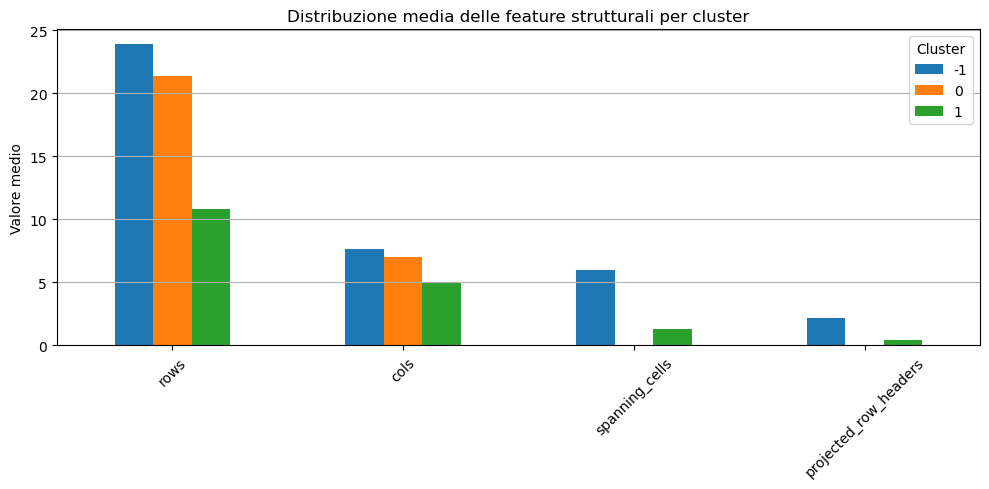

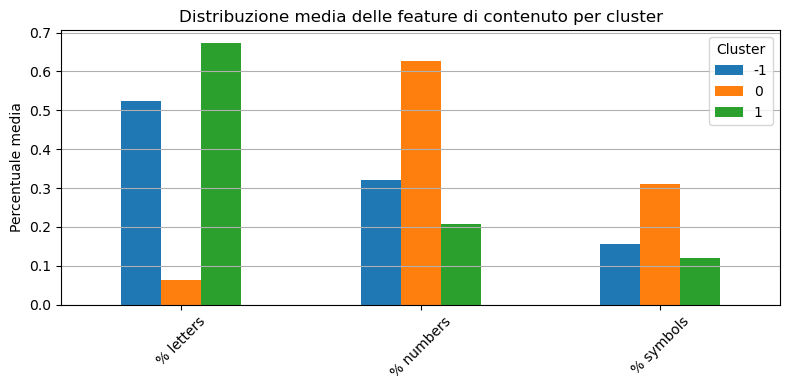

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Divide le feature
structural_features = [
    "rows", "cols", "spanning_cells", 
    #"column_headers", "projected_row_headers"
    "projected_row_headers"
]
content_features = ["% letters", "% numbers", "% symbols"]

# Calcola la media delle feature per ciascun cluster
cluster_means = df_sc.groupby('cluster')[structural_features + content_features].mean()

# Ordina i cluster per coerenza (opzionale)
cluster_means = cluster_means.sort_index()
cluster_labels = cluster_means.index.tolist()
n_clusters = len(cluster_labels)

# Colori coerenti: palette fissa con un colore per cluster
palette = sns.color_palette("tab10", n_colors=n_clusters)
color_mapping = {label: palette[i] for i, label in enumerate(cluster_labels)}

# Ottieni i colori in ordine delle colonne
cluster_colors_ordered = [color_mapping[label] for label in cluster_labels]

# Primo grafico: features strutturali 
cluster_means[structural_features].T.plot(
    kind='bar',
    figsize=(10, 5),
    color=cluster_colors_ordered
)
plt.title("Distribuzione media delle feature strutturali per cluster")
plt.ylabel("Valore medio")
plt.xticks(rotation=45)
plt.grid(True, axis='y')
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()

# Secondo grafico: features di contenuto 
cluster_means[content_features].T.plot(
    kind='bar',
    figsize=(8, 4),
    color=cluster_colors_ordered
)
plt.title("Distribuzione media delle feature di contenuto per cluster")
plt.ylabel("Percentuale media")
plt.xticks(rotation=45)
plt.grid(True, axis='y')
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()

**Riferiti a 8 features** - **Analisi valori medi**: gli outliers hanno una media di `rows` più alta rispetto ai cluster 1 e 2, quindi si ha tabelle mediamente più grandi, tranne per il cluster 2 che ha il maggior numero medio di righe. `spanning_cells` medio negli outliers è più grande rispetto ai clusters. `projected_row_headers` più alto negli outliers, quindi più righe usate come intestazioni. `% letters` medio è più basso nel cluster 2. `% numbers` e `% symbols` medi sono più alti nel cluster 2.

**Riferiti a 7 features** - **Analisi valori medi**: gli outliers presentano mediamente un maggior numero di righe rispetto agli altri cluster, inoltre hanno mediamente più `spanning_cells` e `projected_row_headers` rispetto ai cluster. Analizzando le medie di contenuti dei cluster possiamo notare come le tabelle del cluster 0 abbiano principalmente contenuto numerico e simbolico.

---

## **<span style="color:purple">Conclusioni</span>**

### Riferiti a 8 features:

#### Test Set

L'analisi delle caratteristiche estratte **test set** dal dataset **PubTables-1M** ha permesso di evidenziare importanti differenze tra i gruppi di tabelle identificate dai cluster principali (Cluster 0 e Cluster 1) e gli outliers (Cluster -1). 
Analizzando i due cluster principali si nota che la **discriminante tra cluster 1 e cluster 0** risulta essere la presenza o meno del **column_headers** (Cluster 0 ha column_headers = 1, Cluster 1 ha column_headers = 0). 

Per quanto rigurda l'analisi dei cluster, di seguito si sintetizza le principali osservazioni:

| **Fattore**                      | **Outliers rispetto ai Cluster**                  |
|:----------------------------------|:--------------------------------------------------|
| **Dimensione della tabella (righe/colonne)** | **Molto maggiore**: gli outliers hanno un numero di righe e colonne significativamente superiore rispetto alle tabelle appartenenti ai cluster. |
| **Celle che si estendono su più righe/colonne (spanning cells)** | **Molto maggiore**: gli outliers presentano molte più celle che coprono più righe o colonne, indicando strutture tabellari molto più complesse. |
| **Column headers**  | **Variegato**: le tabelle outlier possono avere o non avere il column headers che per i cluster risulta essere l'elemento discriminante. |
| **Projected row headers**  | **Più numerosi**: le tabelle outlier hanno mediamente più projected row headers, suggerendo una maggiore complessità e gerarchia di contenuti. |
| **% di lettere nel contenuto**    | **Più basso**: il contenuto testuale delle tabelle outlier ha una minore proporzione di lettere rispetto ai cluster, il che indica una minore predominanza di testi descrittivi. |
| **% di numeri nel contenuto**     | **Più alto**: le tabelle outlier contengono più numeri, rendendole più "numeriche" e meno "testuali" rispetto ai cluster principali. |
| **% di simboli nel contenuto**    | **Leggermente più alto**: anche la quantità di simboli (come %, +, -, etc.) è più alta, sebbene la differenza sia meno marcata rispetto a lettere e numeri. |

In conclusione, gli **outliers** identificano tabelle **molto più grandi**, **più complesse** (sia per struttura che per contenuto) rispetto a quelle dei cluster principali. **Strutturalmente**, le tabelle degli outliers si distinguono per **molte più celle spanning** e **più header di riga**, che indicano schemi gerarchici sofisticati o tabelle multi-livello. **Dal punto di vista del contenuto**, gli outliers sono: **meno "descrittivi"** (meno testo) e **più "numerici"** (più cifre e dati numerici).
Quindi le tabelle outlier potrebbero rappresentare **casi particolari** come tabelle di risultati scientifici o raccolte di dati metrici, che potrebbero richiedere strategie di analisi diverse.

#### Train Set

L’analisi delle caratteristiche estratte dal **train set** del dataset **PubTables-1M** ha evidenziato differenze strutturali e contenutistiche significative tra i tre cluster principali (Cluster 0, Cluster 1, Cluster 2) e gli **outliers** (Cluster -1).
La **discriminante principale tra Cluster 0 e Cluster 1** è la presenza del **column_headers**: tutte le tabelle del Cluster 0 hanno `column_headers = 1`, mentre quelle del Cluster 1 e del Cluster 2 hanno `column_headers = 0`.

Anche la **distribuzione numerica** dei dati nei cluster è indicativa:

- **Cluster 0** è largamente predominante, con **701.275 tabelle**, rappresentando strutture tabellari comuni e regolari.
- **Cluster 1** contiene **44.336 tabelle**, meno complesse, senza intestazioni di colonna.
- **Cluster 2** è molto ristretto, con **solo 587 tabelle**, caratterizzate da molte righe e poche colonne.
- Gli **outliers (Cluster -1)** rappresentano **12.651 tabelle**, quindi circa l’1,7% del dataset, e mostrano comportamenti strutturali e contenutistici molto eterogenei. Il loro elemento caratterizzante è l'avere un numero medio di spanning_cells e projected_row_headers più grande rispetto ai clusters.

In sintesi, le tabelle **outlier** rappresentano **strutture più complesse**, sia per la forma (più celle spanning, più headers proiettati) che per il contenuto (combinazioni varie di lettere, numeri e simboli). Le tabelle outlier quindi rappresentano casi particolari come potrebbero essere tabelle di risultati sperimentali o raccolte di dati grezzi.
**Cluster 0** rappresenta **tabelle standard con header di colonna**, **Cluster 1** contiene **tabelle più semplici e compatte**, mentre **Cluster 2** è un sottogruppo **raro con molte righe e pochissime colonne** anche in questo caso si potrebbe trattare di tabelle che raccolgono dati grezzi.

### Riferiti a 7 features:

#### Train Set

L’analisi delle 7 caratteristiche estratte dal **trainset** del dataset PubTables-1M evidenzia **differenze significative** tra i due cluster principali (Cluster 0 e Cluster 1) e gli **outliers** (Cluster -1), in termini sia **strutturali** che **contenutistici**.

Una prima distinzione importante riguarda la **struttura** delle tabelle:
- **Cluster 0** include tabelle **numericamente dense**, compatte e **prive projected_row_headers**.
- **Cluster 1** raccoglie invece tabelle **più descrittive**, testuali, con **frequente presenza di projected_row_headers**.
- **Outliers** risultano essere le tabelle **più eterogenee**, sia per dimensioni che per contenuto, con un uso più intenso di spanning cells e projected_row_headers.

La distribuzione numerica dei dati nei cluster è indicativa:

- **Cluster 1** è largamente predominante, con **604.964 tabelle**.
- **Cluster -1** (outliers) comprende **145.643 tabelle**, circa il 20% del totale.
- **Cluster 0** è un sottogruppo molto ristretto, con **8.242 tabelle**, altamente specifiche: numeriche, standardizzate e senza intestazioni.

In conclusione la **scarsità del Cluster 0** è spiegabile con la sua alta specificità: rappresenta solo tabelle **numericamente compatte e prive di intestazioni** — un caso raro ma ben definito. **Il predominio del Cluster 1** riflette invece la **prevalenza di contenuti testuali strutturati** nel dataset. Gli **outliers (quasi 1 su 5)** indicano una **forte varietà strutturale** nel dataset, che probabilmente riflette la presenza di **formati non convenzionali**, **tabelle complesse** o **errori di annotazione**. 